In [1]:
# Parkinsonics Exploratory Data Analysis v5.0 - 4.28.21

In [2]:
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})
import pandas as pd
import seaborn as sns
import os
import numpy as np
import scipy.stats as stats
import statsmodels.stats.multitest as smt
#import missingno as msno
from statsmodels.stats.anova import AnovaRM
#from .utils import nullity_filter, nullity_sort

pd.options.display.max_rows = 999
pd.options.display.max_columns = 999

In [3]:
%%capture
%run UPDRS_AnalysesV2.0.ipynb

# Import everyth from Bela's notebook for fig 2

In [4]:
# Load randomization patient ID list
IDdf=pd.read_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\Parkinsonics_RandID_ List_DID.xlsx')

IDdf=IDdf[:-5]
S_group=IDdf.loc[IDdf['First Intervention']=='S']
D_group=IDdf.loc[IDdf['First Intervention']=='D']
M_gen=IDdf.loc[IDdf['Gender']=='M']
F_gen=IDdf.loc[IDdf['Gender']=='F']

# Load voice data from mastersheet excel file
masterdf=pd.read_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\Parkinsonics_FINAL_MasterVM_2.xlsx')
masterdf=masterdf.drop('variable', axis=1)
masterdf=masterdf.drop(masterdf.index[[3,10,24,28]])

# Dataset distribution: Hoehn & Yahr, Age, Gender

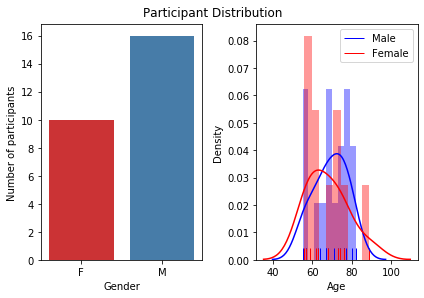

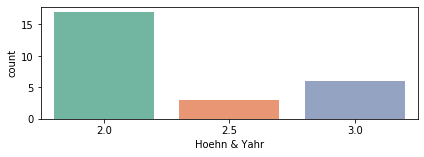

In [3]:
# Gender - bar graph of factor data
plt.subplot(1,2,1)
plt.suptitle('Participant Distribution', verticalalignment='bottom')
gen=sns.countplot(x='Gender', data=IDdf, palette='Set1')
gen.set(ylabel='Number of participants')
plt.tight_layout()

# Age - bar graph of continuous data
plt.subplot(1,2,2)
age=sns.distplot(M_gen['Age'], rug=True, hist=True, norm_hist=False, bins=9, color='b')
age=sns.distplot(F_gen['Age'], rug=True, hist=True, norm_hist=False, bins=9, color='r')
plt.legend(['Male', 'Female'])
age.set(ylabel='Density')
plt.tight_layout()
plt.show()

# Hoehn & Yahr - bar graph of stages of PD
plt.subplot(2,1,2)
sns.countplot(x='Hoehn & Yahr', data=IDdf, palette='Set2')
plt.tight_layout()
plt.show()

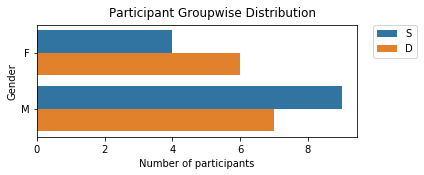

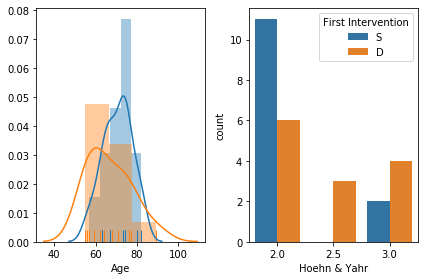

In [5]:
# Visualize population distributions within the two groups to see if randomization was successful
# Do the same things but this time hue by First Intervention

# Gender - bar graph of factor data
plt.subplot(2,1,1)
plt.suptitle('Participant Groupwise Distribution', verticalalignment='bottom')
gen=sns.countplot(y='Gender', data=IDdf, hue='First Intervention')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
gen.set(xlabel='Number of participants')
plt.tight_layout()
plt.show()

# Age - bar graph of continuous data
plt.subplot(1,2,1)
sns.distplot(S_group['Age'], rug=True, hist=True, norm_hist=True)
sns.distplot(D_group['Age'], rug=True, hist=True, norm_hist=True)
plt.tight_layout()

# Hoehn & Yahr - the most important one
plt.subplot(1,2,2)
sns.countplot(x='Hoehn & Yahr', data=IDdf, hue='First Intervention')
plt.tight_layout()
plt.show()

In [6]:
# Do parametricity and t tests to see if patient randomization was successful
# Apply Scipy: Kolmogorov-Smirnov, Shapiro-Wilks, D'Agostino
# Data in question: ages, gender, and HY for the two groups. Total of 6 sets

# Dataframe with parametricity results and df with data to test from
rdmdata_df=pd.DataFrame()
rdmtempd_df=pd.DataFrame()
rdmtemps_df=pd.DataFrame()

for i in IDdf.columns[2:4]:
    rdmtempd_df['D '+i]=D_group[i]
    rdmtemps_df['S '+i]=S_group[i]

rdmtempd_df=rdmtempd_df.reset_index(drop=True)
rdmtemps_df=rdmtemps_df.reset_index(drop=True)
rdmdata_df=pd.concat([rdmtempd_df, rdmtemps_df], axis=1)

# Apply parametricity tests to each column
rdmnorm_df=pd.DataFrame(columns=['KS', 'SW', 'NT'], index=rdmdata_df.columns)
for i in rdmdata_df.columns:
    loc, scale= stats.norm.fit(rdmdata_df[i])
    n=stats.norm(loc=loc, scale=scale)
    p=stats.kstest(rdmdata_df[i], n.cdf)
    if p.pvalue>0.05:
        rdmnorm_df.loc[i, 'KS']='N'
    if p.pvalue<0.05:
        rdmnorm_df.loc[i, 'KS']='Y'
    
    stat, p=stats.shapiro(rdmdata_df[i])
    
    if p>0.05:
        rdmnorm_df.loc[i, 'SW']='N'
    if p<0.05:
        rdmnorm_df.loc[i, 'SW']='Y'
    
    stat, p=stats.normaltest(rdmdata_df[i])
    if p>0.05:
        rdmnorm_df.loc[i, 'NT']='N'
    if p<0.05:
        rdmnorm_df.loc[i, 'NT']='Y'

C:\Users\kevin\Downloads\Install\Programming\Anaconda\lib\site-packages\scipy\stats\stats.py:1535: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=13
  "anyway, n=%i" % int(n))


In [7]:
# At this point, we see D HY is normal while S HY isn't. Automatically, this means there is sig difference
# This is pretty heavily dependent on the fact that there are only 2 categories though: 2, 2.5, 3. Comparison won't rlly do anythin
# However, we can apply unpaired 2 tailed t test to the age dists to see if randomization was successful there
# Null hyp: the means are identical for the two group age distributions
t, pval=stats.ttest_ind(rdmdata_df['D Age'], rdmdata_df['S Age'])
if pval>0.05:
    print('Fail to reject null hypothesis with a p value of '+str(pval)+'>0.05.')

Fail to reject null hypothesis with a p value of 0.2862533237337943>0.05.


In [5]:
# Define a function to create a subdf with the means across the 3 trials per timepoint of a single var
# 1 value per patient per timepoint/comparison
# Parameters: col1 col2 ints, beginning and end cols of the variable in masterdf
#             ae mm param strings, A/E Max/Min Variable
# Fn format works for every var except max/min/avg db

def vowelmeandf(col1, col2, ae, mm, param):
    var_descrip=ae+' '+mm+' '+param
    raws=masterdf.iloc[:,col1:col2]
    raws_mean=pd.DataFrame()
    raws_plot=pd.DataFrame()
    raws_temp=pd.DataFrame()
    raws_mean[var_descrip]=0
    raws_mean['ID']=masterdf.iloc[:,0]
    
    for i in (0,3,6,9,12,15):
        raws_temp=raws.iloc[:,[i, i+1, i+2]]
        raws_mean[var_descrip+' V'+str(int(i/3))]=raws_temp.mean(axis=1)
    
    raws_mean['Delta V2-BL']=raws_mean[var_descrip+' V2']-raws_mean[var_descrip+' V0']
    raws_mean['Delta V3-V2']=raws_mean[var_descrip+' V3']-raws_mean[var_descrip+' V2']
    raws_mean['Delta V4-V2']=raws_mean[var_descrip+' V4']-raws_mean[var_descrip+' V2']
    raws_mean['Delta V5-V2']=raws_mean[var_descrip+' V5']-raws_mean[var_descrip+' V2']
    raws_mean['Delta V5-V4']=raws_mean[var_descrip+' V5']-raws_mean[var_descrip+' V4']
    raws_mean=raws_mean.iloc[:]
    
    raws_mean['First Intervention']='D'
    for i in raws_mean['ID']:
        for j in S_group['ID']:
            if i==float(j):
                raws_mean.loc[raws_mean['ID']==i, 'First Intervention']='S'
   
    raws_plot=varplotdf(raws_mean)   
                
    return raws_mean, raws_plot

def passagedf(col1, col2, passage, param):
    var_descrip=passage+' '+param
    raws=masterdf.iloc[:,col1:col2]
    raws_plot=pd.DataFrame()
    raws_mean=pd.DataFrame()
    raws_mean[var_descrip]=0
    raws_mean['ID']=masterdf.iloc[:,0]
    
    for i in range(0,6):
        raws_mean[var_descrip+' V'+str(i)]=raws.iloc[:,i]
    
    raws_mean['Delta V2-BL']=raws_mean[var_descrip+' V2']-raws_mean[var_descrip+' V0']
    raws_mean['Delta V3-V2']=raws_mean[var_descrip+' V3']-raws_mean[var_descrip+' V2']
    raws_mean['Delta V4-V2']=raws_mean[var_descrip+' V4']-raws_mean[var_descrip+' V2']
    raws_mean['Delta V5-V2']=raws_mean[var_descrip+' V5']-raws_mean[var_descrip+' V2']
    raws_mean['Delta V5-V4']=raws_mean[var_descrip+' V5']-raws_mean[var_descrip+' V4']
    raws_mean=raws_mean.iloc[:]
    
    raws_mean['First Intervention']='D'
    for i in raws_mean['ID']:
        for j in S_group['ID']:
            if i==float(j):
                raws_mean.loc[raws_mean['ID']==i, 'First Intervention']='S'
   
    raws_plot=varplotdf(raws_mean)   
                
    return raws_mean, raws_plot
    
# Function to create the plot dfs
# To be called in variablemeandf

def varplotdf(meandf):
    vars_plot1=pd.DataFrame()
    vars_plot2=pd.DataFrame()
    vars_plot3=pd.DataFrame()
    vars_plot4=pd.DataFrame()
    
    vars_temp=meandf.loc[meandf['First Intervention']=='D']
    vars_plot1['1']=vars_temp['Delta V2-BL']
    vars_plot3['1']=vars_temp['Delta V4-V2']
    vars_plot1['Group']='D1'
    vars_plot3['Group']='D2'
    
    vars_temp=meandf.loc[meandf['First Intervention']=='S']
    vars_plot2['1']=vars_temp['Delta V2-BL']
    vars_plot4['1']=vars_temp['Delta V4-V2']
    vars_plot2['Group']='S1'
    vars_plot4['Group']='S2'
            
    vars_plot=pd.concat([vars_plot1, vars_plot2, vars_plot3, vars_plot4], sort=False)
    vars_plot.columns=['Delta from treatment', 'Group']
    vars_plot['Delta from treatment']=vars_plot['Delta from treatment'].astype(float)
    
    return vars_plot

# Define function specifically to break down avg/max/min dB
# Everything should stay the same except for the columns iloc-ed in first for loop
# Params: col1 is the first incident of the max min or average
#         col2 is the col1+48, or last incident of the chosen max min avg
def dbmeandf(col1, col2, ae, mm, param):
    var_descrip=ae+' '+mm+' '+param
    raws=masterdf.iloc[:,col1:col2]
    raws_mean=pd.DataFrame()
    raws_plot=pd.DataFrame()
    raws_mean[var_descrip]=0 
    raws_mean['ID']=masterdf.iloc[:,0]
    raws_temp=pd.DataFrame()
    
    for i in (0,9,18,27,36,45):
        raws_temp=raws.iloc[:,[i, i+1, i+2]]
        raws_mean[var_descrip+' V'+str(int(i/9))]=raws_temp.mean(axis=1)
  
    raws_mean['Delta V2-BL']=raws_mean[var_descrip+' V2']-raws_mean[var_descrip+' V0']
    raws_mean['Delta V3-V2']=raws_mean[var_descrip+' V3']-raws_mean[var_descrip+' V2']
    raws_mean['Delta V4-V2']=raws_mean[var_descrip+' V4']-raws_mean[var_descrip+' V2']
    raws_mean['Delta V5-V2']=raws_mean[var_descrip+' V5']-raws_mean[var_descrip+' V2']
    raws_mean['Delta V5-V4']=raws_mean[var_descrip+' V5']-raws_mean[var_descrip+' V4']
    raws_mean=raws_mean.iloc[:]
    
    raws_mean['First Intervention']='D'
    for i in raws_mean['ID']:
        for j in S_group['ID']:
            if i==float(j):
                raws_mean.loc[raws_mean['ID']==i, 'First Intervention']='S'
                
    raws_plot=varplotdf(raws_mean)
                
    return raws_mean, raws_plot

def dbpassdf(col1, col2, passage, param):
    var_descrip=passage+' '+param
    raws=masterdf.iloc[:,col1:col2]
    raws_mean=pd.DataFrame()
    raws_plot=pd.DataFrame()
    raws_mean[var_descrip]=0 
    raws_mean['ID']=masterdf.iloc[:,0]
    
    for i in (0,3,6,9,12,15):
        raws_mean[var_descrip+' V'+str(int(i/3))]=raws.iloc[:,i]
  
    raws_mean['Delta V2-BL']=raws_mean[var_descrip+' V2']-raws_mean[var_descrip+' V0']
    raws_mean['Delta V3-V2']=raws_mean[var_descrip+' V3']-raws_mean[var_descrip+' V2']
    raws_mean['Delta V4-V2']=raws_mean[var_descrip+' V4']-raws_mean[var_descrip+' V2']
    raws_mean['Delta V5-V2']=raws_mean[var_descrip+' V5']-raws_mean[var_descrip+' V2']
    raws_mean['Delta V5-V4']=raws_mean[var_descrip+' V5']-raws_mean[var_descrip+' V4']
    raws_mean=raws_mean.iloc[:]
    
    raws_mean['First Intervention']='D'
    for i in raws_mean['ID']:
        for j in S_group['ID']:
            if i==float(j):
                raws_mean.loc[raws_mean['ID']==i, 'First Intervention']='S'
                
    raws_plot=varplotdf(raws_mean)
                
    return raws_mean, raws_plot
    

# Apply varmeandf to every var

Doesn't work for max/min/avg db

Apply dbmeandf to each vowel sound for avg/min/max

Also make dfs for plotting

In [94]:
# A Max all vars
amax_dur_mean, amax_dur_plot=vowelmeandf(1, 19, 'A', 'Loud', 'Duration')
amax_mf0_mean, amax_mf0_plot=vowelmeandf(19, 37, 'A', 'Loud', 'Mean F0')
amax_jit_mean, amax_jit_plot=vowelmeandf(37, 55, 'A', 'Loud', 'Jitter, loc')
amax_shm_mean, amax_shm_plot=vowelmeandf(55, 73, 'A', 'Loud', 'Shimmer, loc')
amax_hnr_mean, amax_hnr_plot=vowelmeandf(73, 91, 'A', 'Loud', 'HNR')
amax_avgdb_mean, amax_avgdb_plot=dbmeandf(91, 139, 'A', 'Loud', 'Avg dB')
amax_mindb_mean, amax_mindb_plot=dbmeandf(94, 142, 'A', 'Loud', 'Low dB')
amax_maxdb_mean, amax_maxdb_plot=dbmeandf(97, 145, 'A', 'Loud', 'High dB')

In [95]:
amax_qual_mean=pd.concat([amax_dur_mean.iloc[:, 1:-1], amax_mf0_mean.iloc[:, 2:-1], 
                          amax_jit_mean.iloc[:, 2:-1], amax_shm_mean.iloc[:, 2:-1],
                          amax_hnr_mean.iloc[:, 2:]], axis=1)

amax_db_mean=pd.concat([amax_avgdb_mean.iloc[:, 1:-1], amax_mindb_mean.iloc[:, 2:-1], 
                         amax_maxdb_mean.iloc[:, 2:]], axis=1)
amaxdf=pd.concat([amax_qual_mean.iloc[:, :-1], amax_db_mean.iloc[:, 1:]], axis=1)

In [96]:
# A Min all vars
amin_dur_mean, amin_dur_plot=vowelmeandf(145, 163, 'A', 'Speaking', 'Duration')
amin_mf0_mean, amin_mf0_plot=vowelmeandf(163, 181, 'A', 'Speaking', 'Mean F0')
amin_jit_mean, amin_jit_plot=vowelmeandf(181, 199, 'A', 'Speaking', 'Jitter, loc')
amin_shm_mean, amin_shm_plot=vowelmeandf(199, 217, 'A', 'Speaking', 'Shimmer, loc')
amin_hnr_mean, amin_hnr_plot=vowelmeandf(217, 235, 'A', 'Speaking', 'HNR')
amin_avgdb_mean, amin_avgdb_plot=dbmeandf(235, 283, 'A', 'Speaking', 'Avg dB')
amin_mindb_mean, amin_mindb_plot=dbmeandf(238, 286, 'A', 'Speaking', 'Low dB')
amin_maxdb_mean, amin_maxdb_plot=dbmeandf(241, 289, 'A', 'Speaking', 'High dB')

In [97]:
amin_qual_mean=pd.concat([amin_dur_mean.iloc[:, 1:-1], amin_mf0_mean.iloc[:, 2:-1], 
                          amin_jit_mean.iloc[:, 2:-1], amin_shm_mean.iloc[:, 2:-1],
                          amin_hnr_mean.iloc[:, 2:]], axis=1)

amin_db_mean=pd.concat([amin_avgdb_mean.iloc[:, 1:-1], amin_mindb_mean.iloc[:, 2:-1], 
                         amin_maxdb_mean.iloc[:, 2:]], axis=1)
amindf=pd.concat([amin_qual_mean.iloc[:, :-1], amin_db_mean.iloc[:, 1:]], axis=1)

In [98]:
# E Max all vars
emax_dur_mean, emax_dur_plot=vowelmeandf(289, 307, 'E', 'Loud', 'Duration')
emax_mf0_mean, emax_mf0_plot=vowelmeandf(307, 325, 'E', 'Loud', 'Mean F0')
emax_jit_mean, emax_jit_plot=vowelmeandf(325, 343, 'E', 'Loud', 'Jitter, loc')
emax_shm_mean, emax_shm_plot=vowelmeandf(343, 361, 'E', 'Loud', 'Shimmer, loc')
emax_hnr_mean, emax_hnr_plot=vowelmeandf(361, 379, 'E', 'Loud', 'HNR')
emax_avgdb_mean, emax_avgdb_plot=dbmeandf(379, 427, 'E', 'Loud', 'Avg dB')
emax_mindb_mean, emax_mindb_plot=dbmeandf(382, 430, 'E', 'Loud', 'Low dB')
emax_maxdb_mean, emax_maxdb_plot=dbmeandf(385, 433, 'E', 'Loud', 'High dB')

In [99]:
emax_qual_mean=pd.concat([emax_dur_mean.iloc[:, 1:-1], emax_mf0_mean.iloc[:, 2:-1], 
                          emax_jit_mean.iloc[:, 2:-1], emax_shm_mean.iloc[:, 2:-1],
                          emax_hnr_mean.iloc[:, 2:]], axis=1)

emax_db_mean=pd.concat([emax_avgdb_mean.iloc[:, 1:-1], emax_mindb_mean.iloc[:, 2:-1], 
                         emax_maxdb_mean.iloc[:, 2:]], axis=1)
emaxdf=pd.concat([emax_qual_mean.iloc[:, :-1], emax_db_mean.iloc[:, 1:]], axis=1)

In [100]:
# E Min all vars
emin_dur_mean, emin_dur_plot=vowelmeandf(433, 451, 'E', 'Speaking', 'Duration')
emin_mf0_mean, emin_mf0_plot=vowelmeandf(451, 469, 'E', 'Speaking', 'Mean F0')
emin_jit_mean, emin_jit_plot=vowelmeandf(469, 487, 'E', 'Speaking', 'Jitter, loc')
emin_shm_mean, emin_shm_plot=vowelmeandf(487, 505, 'E', 'Speaking', 'Shimmer, loc')
emin_hnr_mean, emin_hnr_plot=vowelmeandf(505, 523, 'E', 'Speaking', 'HNR')
emin_avgdb_mean, emin_avgdb_plot=dbmeandf(523, 571, 'E', 'Speaking', 'Avg dB')
emin_mindb_mean, emin_mindb_plot=dbmeandf(526, 574, 'E', 'Speaking', 'Low dB')
emin_maxdb_mean, emin_maxdb_plot=dbmeandf(529, 577, 'E', 'Speaking', 'High dB')

In [101]:
emin_qual_mean=pd.concat([emin_dur_mean.iloc[:, 1:-1], emin_mf0_mean.iloc[:, 2:-1], 
                          emin_jit_mean.iloc[:, 2:-1], emin_shm_mean.iloc[:, 2:-1],
                          emin_hnr_mean.iloc[:, 2:]], axis=1)

emin_db_mean=pd.concat([emin_avgdb_mean.iloc[:, 1:-1], emin_mindb_mean.iloc[:, 2:-1], 
                         emin_maxdb_mean.iloc[:, 2:]], axis=1)
emindf=pd.concat([emin_qual_mean.iloc[:, :-1], emin_db_mean.iloc[:, 1:]], axis=1)


In [102]:
# Rainbow all vars
rain_dur, rain_dur_plot=passagedf(577, 583, 'Rainbow', 'Duration')
rain_mf0, rain_mf0_plot=passagedf(583, 589, 'Rainbow', 'Mean F0')
rain_jit, rain_jit_plot=passagedf(589, 595, 'Rainbow', 'Jitter, loc')
rain_shm, rain_shm_plot=passagedf(595, 601, 'Rainbow', 'Shimmer, loc')
rain_hnr, rain_hnr_plot=passagedf(601, 607, 'Rainbow', 'HNR')
rain_avgdb, rain_avgdb_plot=dbpassdf(607, 623, 'Rainbow', 'Avg dB')
rain_mindb, rain_mindb_plot=dbpassdf(608, 624, 'Rainbow', 'Low dB')
rain_maxdb, rain_maxdb_plot=dbpassdf(609, 625, 'Rainbow', 'High dB')

In [103]:
rain_qual=pd.concat([rain_dur.iloc[:, 1:-1], rain_mf0.iloc[:, 2:-1], 
                          rain_jit.iloc[:, 2:-1], rain_shm.iloc[:, 2:-1],
                          rain_hnr.iloc[:, 2:]], axis=1)

rain_db=pd.concat([rain_avgdb.iloc[:, 1:-1], rain_mindb.iloc[:, 2:-1], 
                         rain_maxdb.iloc[:, 2:]], axis=1)
raindf=pd.concat([rain_qual.iloc[:, :-1], rain_db.iloc[:, 1:]], axis=1)

In [104]:
# Cookie all vars
cookie_dur, cookie_dur_plot=passagedf(625, 631, 'Cookie', 'Duration')
cookie_mf0, cookie_mf0_plot=passagedf(631, 637, 'Cookie', 'Mean F0')
cookie_jit, cookie_jit_plot=passagedf(637, 643, 'Cookie', 'Jitter, loc')
cookie_shm, cookie_shm_plot=passagedf(643, 649, 'Cookie', 'Shimmer, loc')
cookie_hnr, cookie_hnr_plot=passagedf(649, 655, 'Cookie', 'HNR')
cookie_avgdb, cookie_avgdb_plot=dbpassdf(655, 671, 'Cookie', 'Avg dB')
cookie_mindb, cookie_mindb_plot=dbpassdf(656, 672, 'Cookie', 'Low dB')
cookie_maxdb, cookie_maxdb_plot=dbpassdf(657, 673, 'Cookie', 'High dB')

In [105]:
cookie_qual=pd.concat([cookie_dur.iloc[:, 1:-1], cookie_mf0.iloc[:, 2:-1], 
                          cookie_jit.iloc[:, 2:-1], cookie_shm.iloc[:, 2:-1],
                          cookie_hnr.iloc[:, 2:]], axis=1)

cookie_db=pd.concat([cookie_avgdb.iloc[:, 1:-1], cookie_mindb.iloc[:, 2:-1], 
                         cookie_maxdb.iloc[:, 2:]], axis=1)
cookiedf=pd.concat([cookie_qual.iloc[:, :-1], cookie_db.iloc[:, 1:]], axis=1)

Package all meandfs into a list for looping

In [106]:
meandflist=[amax_dur_mean, amax_mf0_mean, amax_jit_mean, amax_shm_mean, amax_hnr_mean,
            amax_avgdb_mean, amax_mindb_mean, amax_maxdb_mean, amin_dur_mean, amin_mf0_mean,
            amin_jit_mean, amin_shm_mean, amin_hnr_mean, amin_avgdb_mean, amin_mindb_mean, 
            amin_maxdb_mean, emax_dur_mean, emax_mf0_mean, emax_jit_mean, emax_shm_mean,
            emax_hnr_mean, emax_avgdb_mean, emax_mindb_mean, emax_maxdb_mean, emin_dur_mean, 
            emin_mf0_mean, emin_jit_mean, emin_shm_mean, emin_hnr_mean, emin_avgdb_mean, emin_mindb_mean, 
            emin_maxdb_mean, rain_dur, rain_mf0, rain_jit, rain_shm, rain_hnr, rain_avgdb, rain_mindb,
            rain_maxdb, cookie_dur, cookie_mf0, cookie_jit, cookie_shm, cookie_hnr, cookie_avgdb,
            cookie_mindb, cookie_maxdb]

# Missing Data Visualisation

Utilize missingno to create nullity matrix and nullity correlation heatmap between all vars


How much data is missing?

In [38]:
miss_count=0
tot_count=0
for col in range(len(masterdf.columns)):
    for row in range(26):
        tot_count+=1
        if np.isnan(masterdf.iloc[row, col]):
            miss_count+=1
                
miss_ratio=miss_count/tot_count
miss_ratio

0.008686707052234541

All data nullity matrix

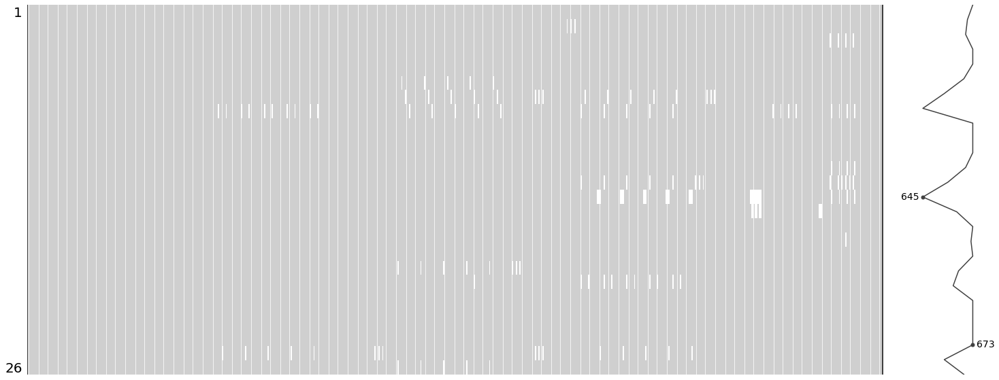

In [39]:
#msno.matrix(masterdf)

Vowel/passage specific nullity matrices

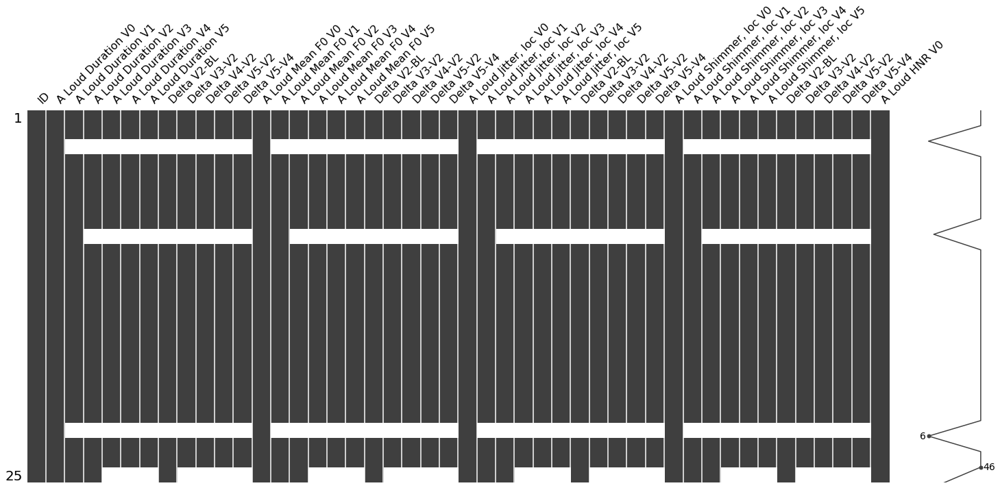

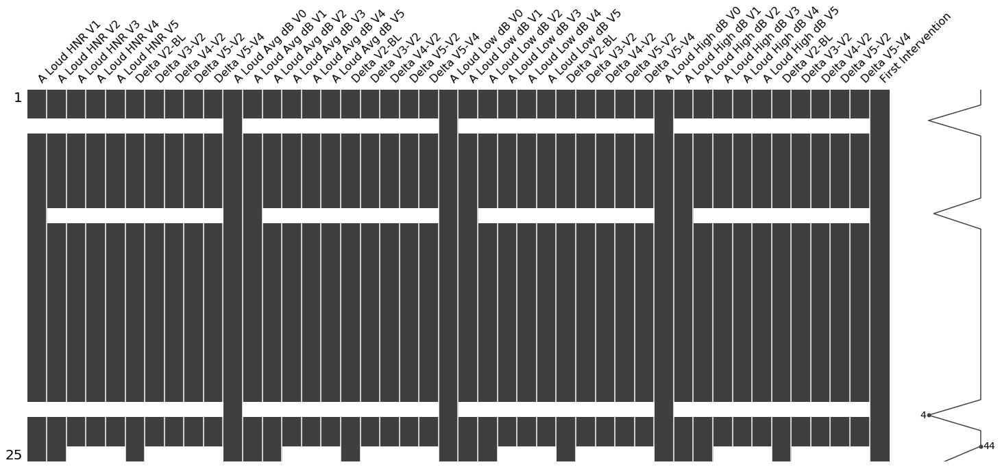

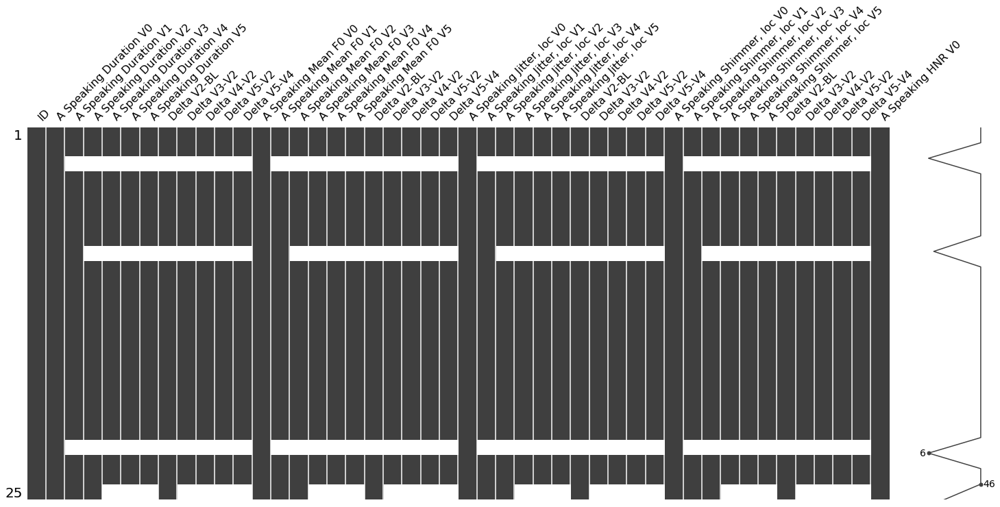

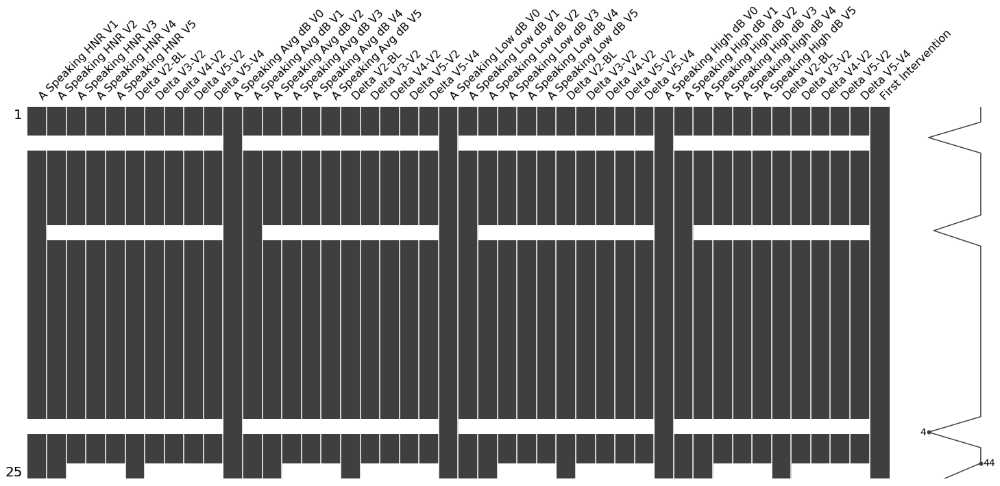

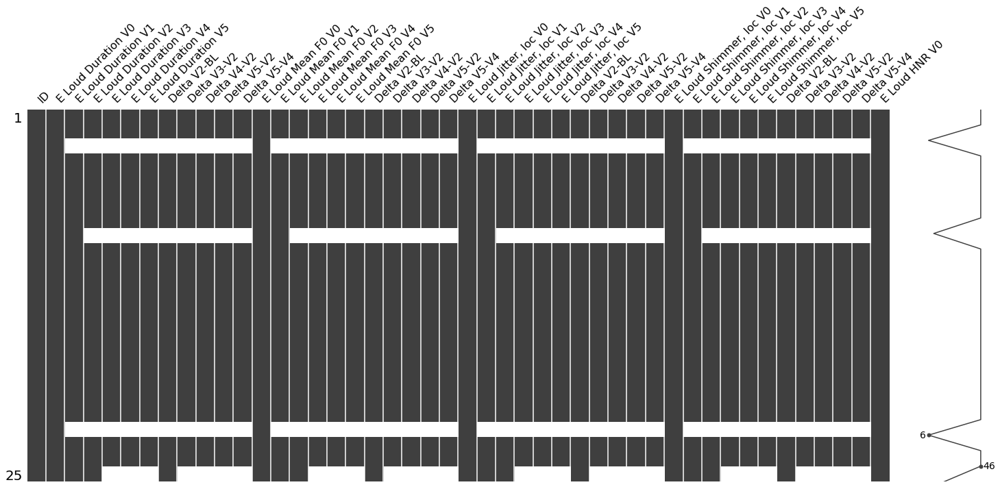

...

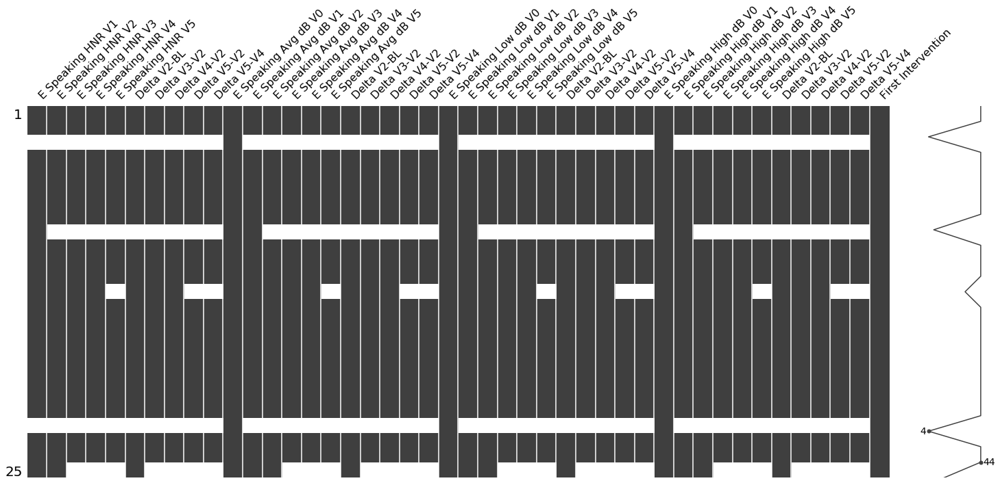

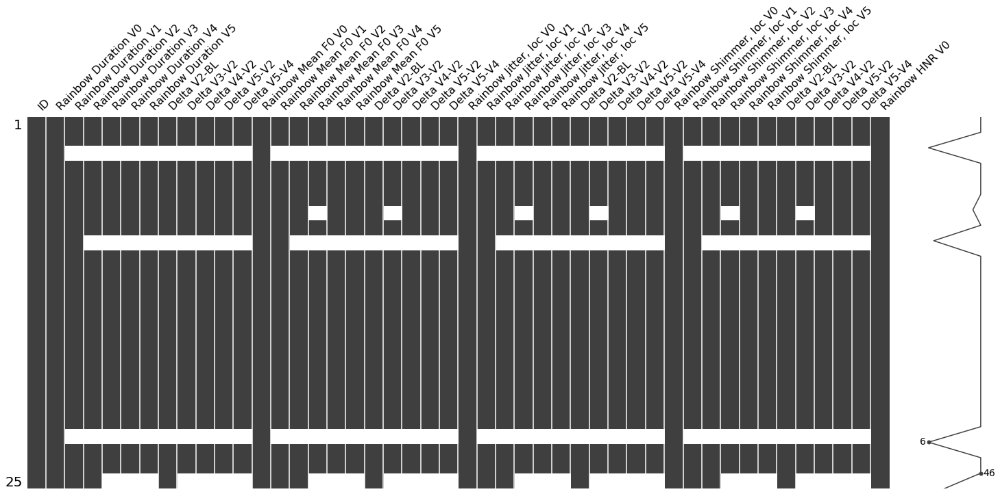

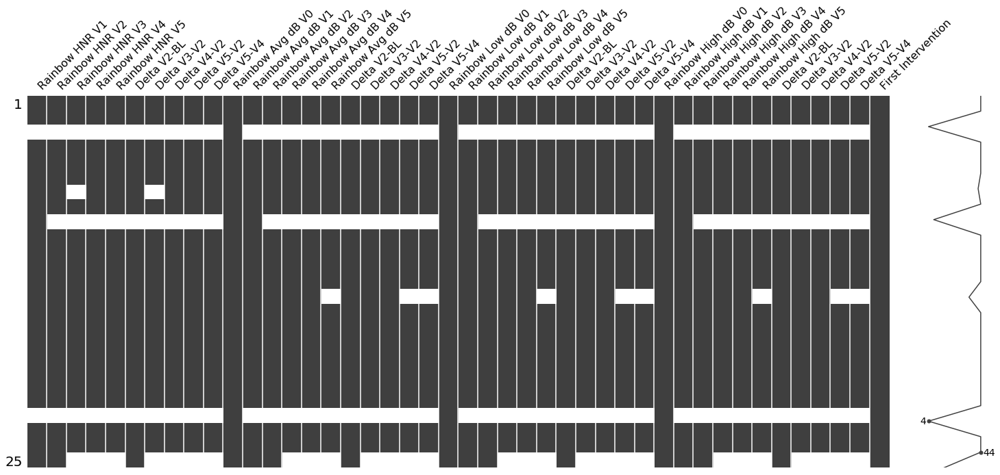

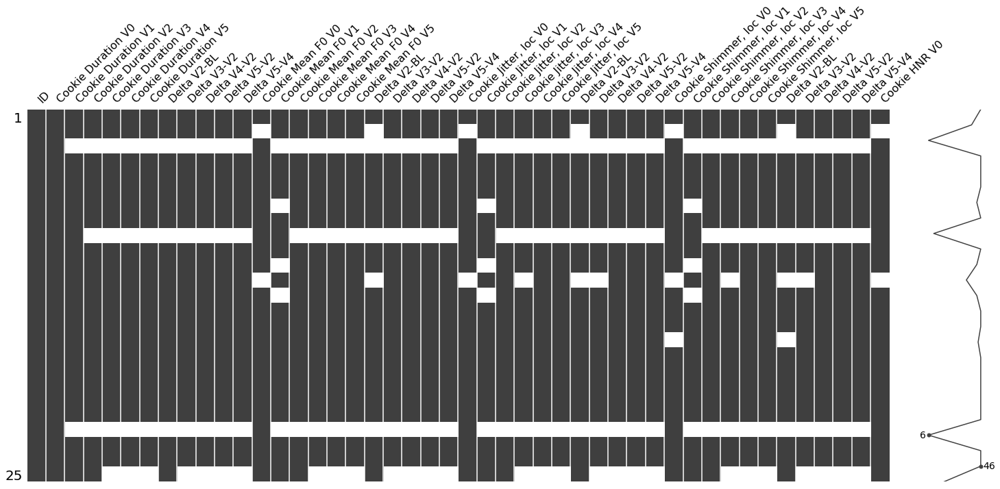

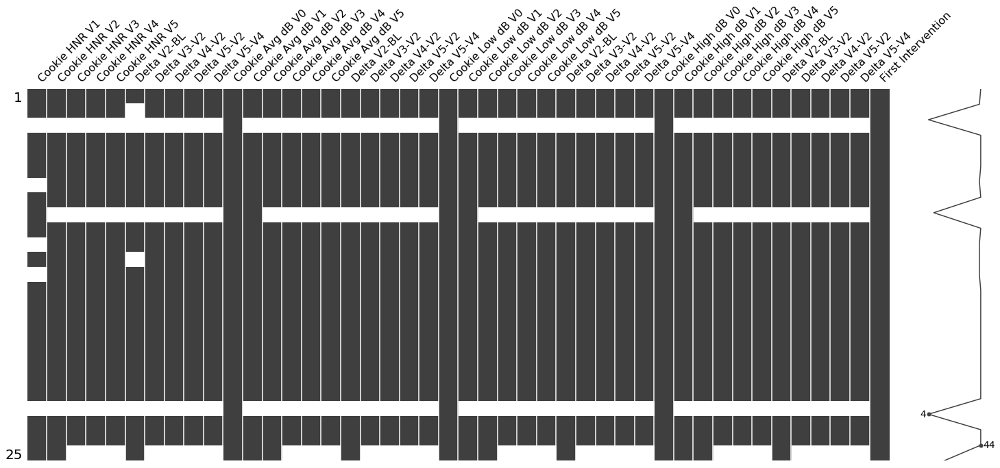

In [90]:
# msno.matrix(amaxdf.iloc[:, :46])
# msno.matrix(amaxdf.iloc[:, 46:])
# msno.matrix(amindf.iloc[:, :46])
# msno.matrix(amindf.iloc[:, 46:])

# msno.matrix(emaxdf.iloc[:, :46])
# msno.matrix(emaxdf.iloc[:, 46:])
# msno.matrix(emindf.iloc[:, :46])
# msno.matrix(emindf.iloc[:, 46:])

# msno.matrix(raindf.iloc[:, :46])
# msno.matrix(raindf.iloc[:, 46:])
# msno.matrix(cookiedf.iloc[:, :46])
# msno.matrix(cookiedf.iloc[:, 46:])

Nullity correlation heatmaps: split into a, e, rainbowcookie

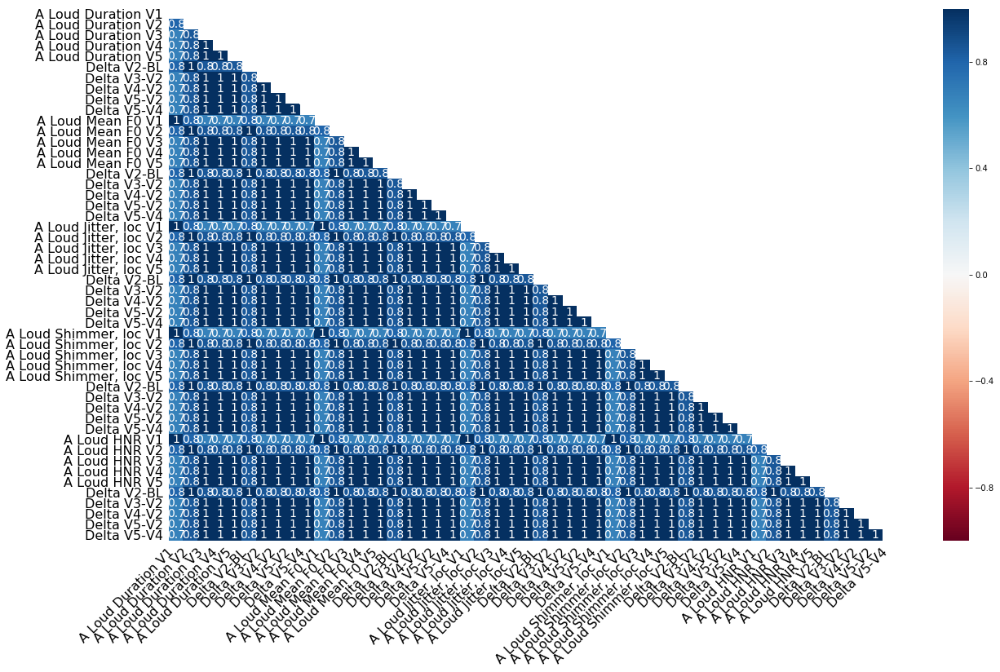

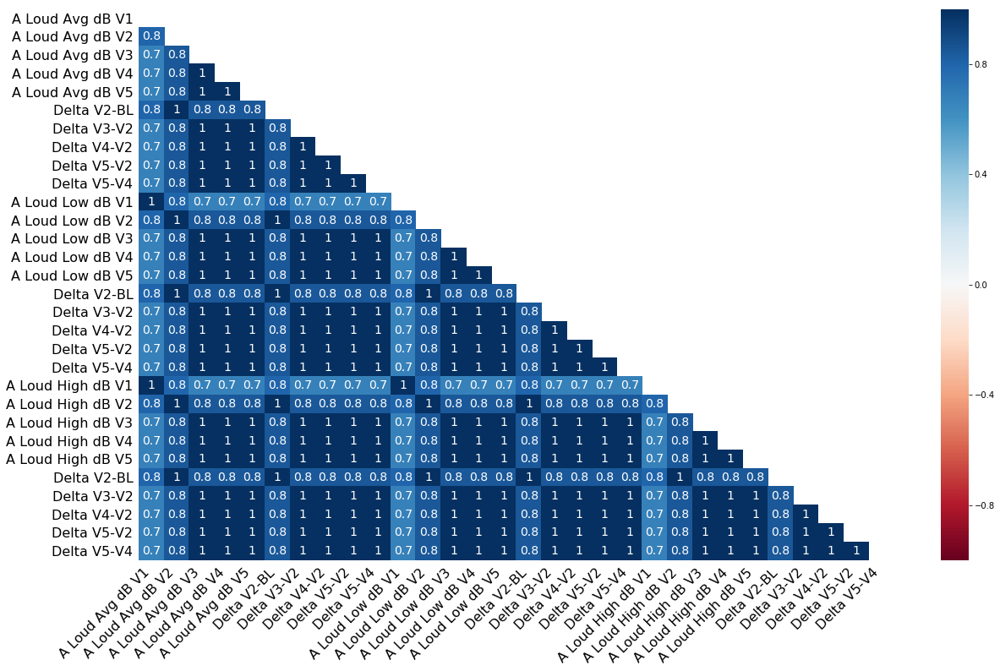

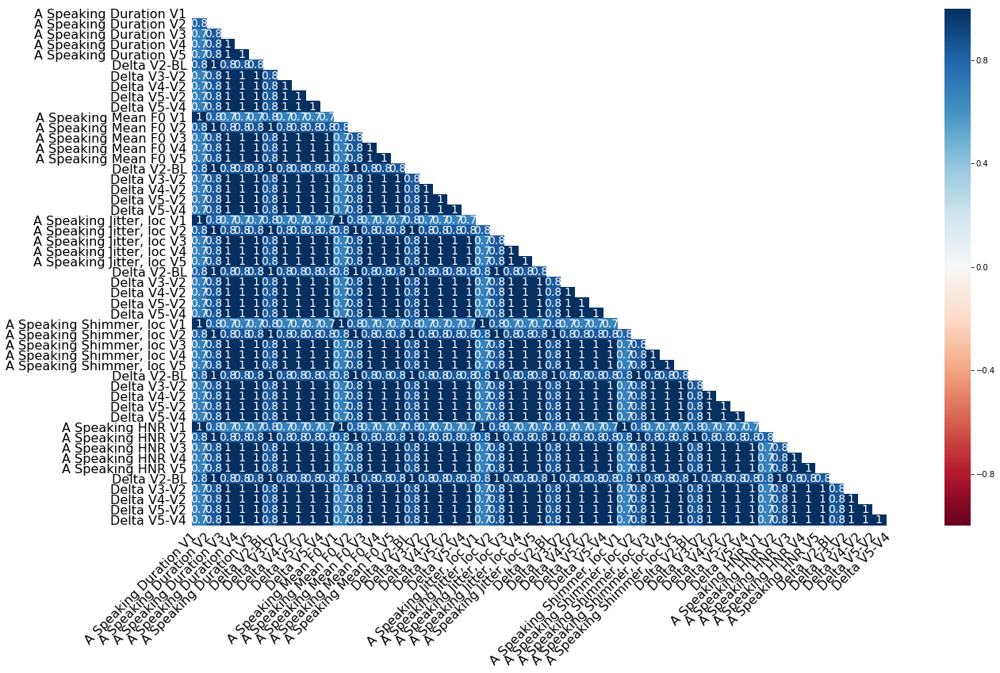

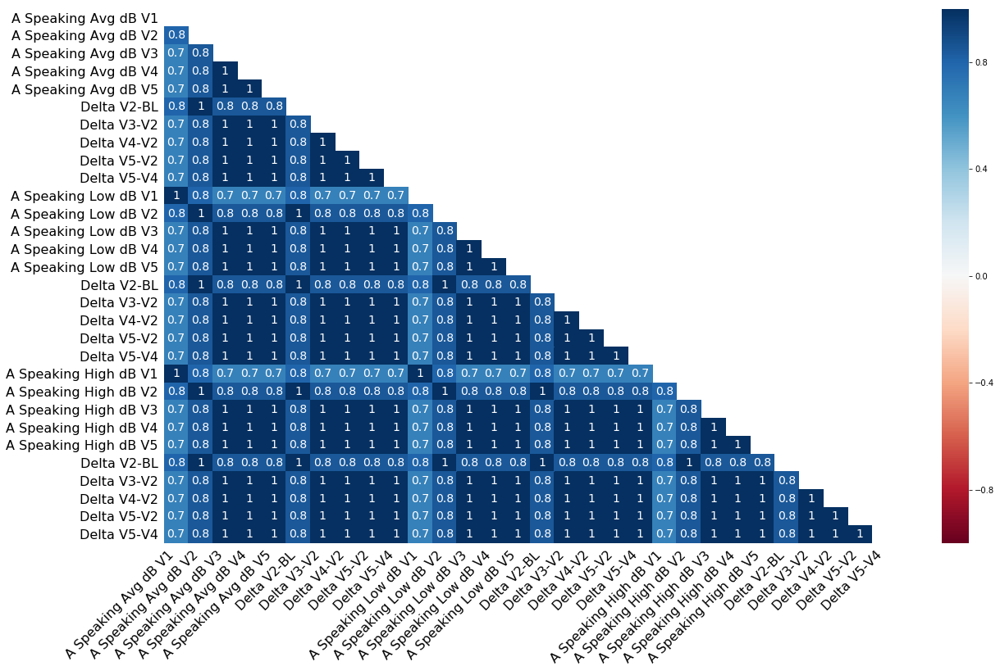

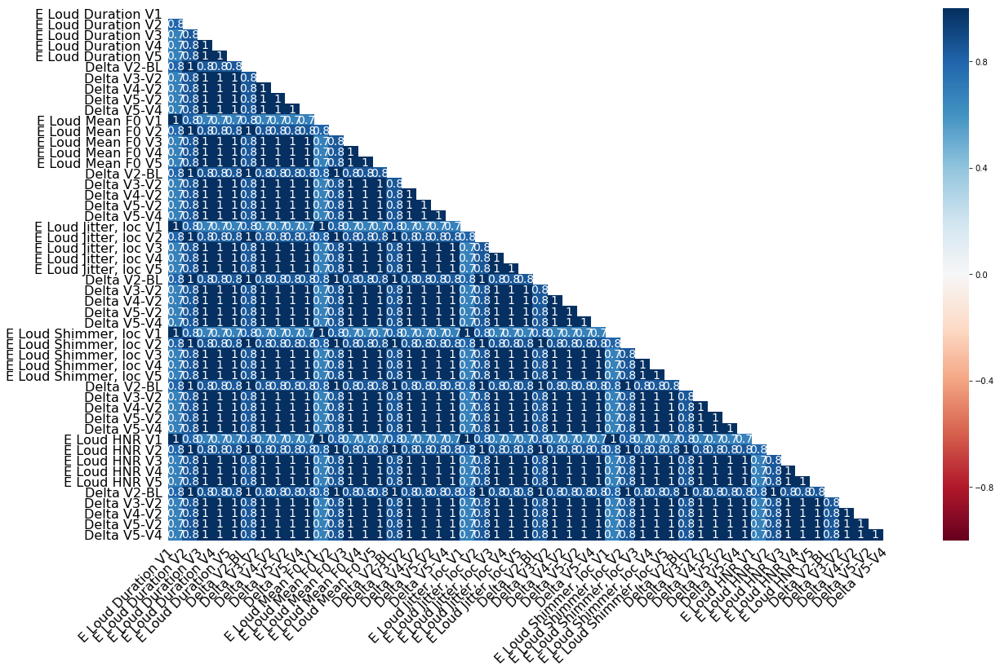

...

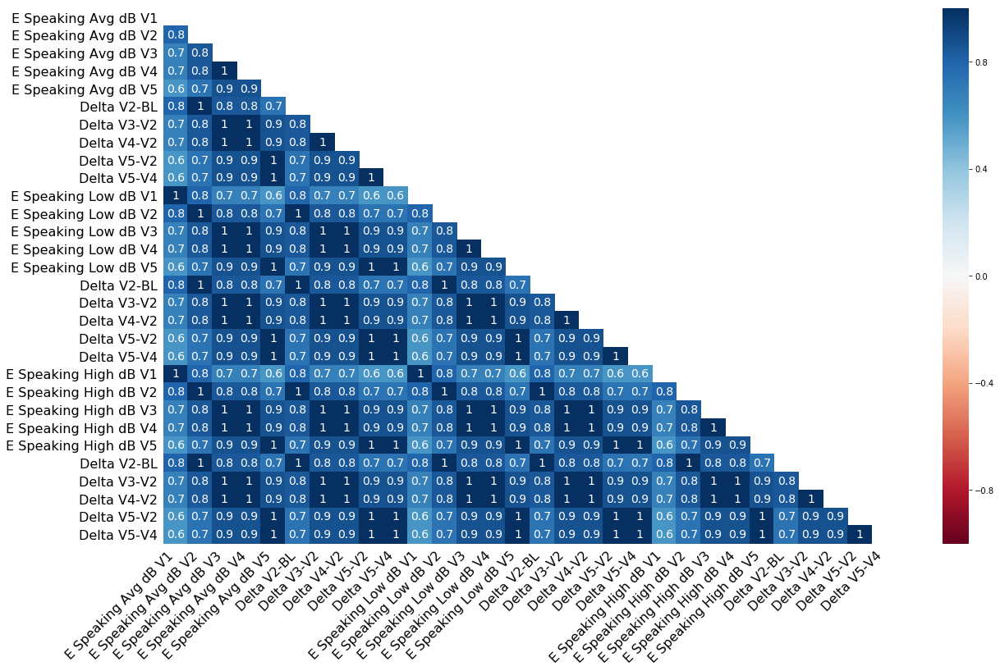

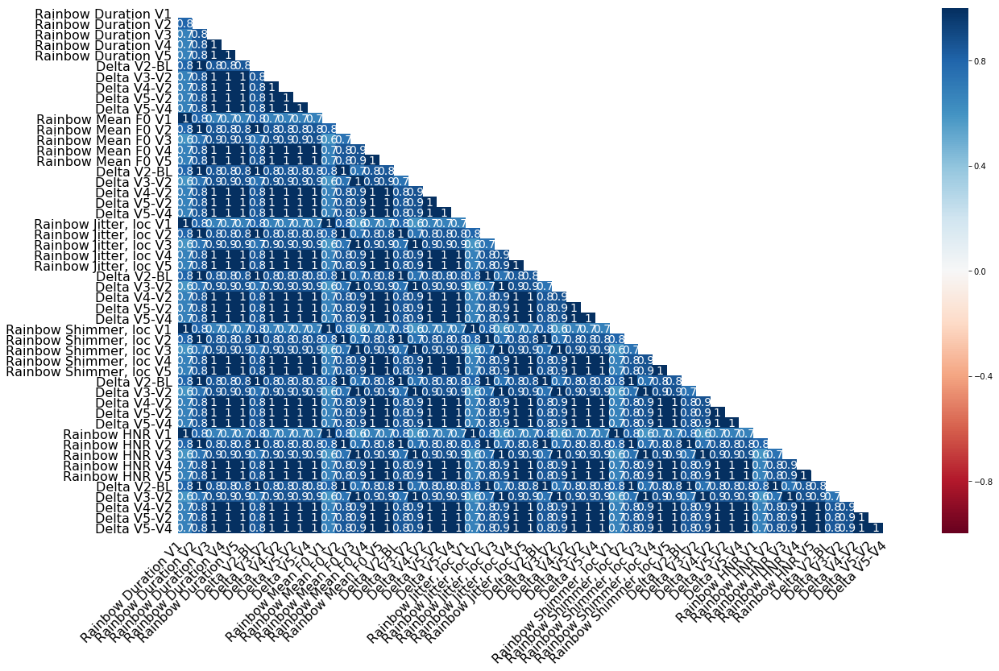

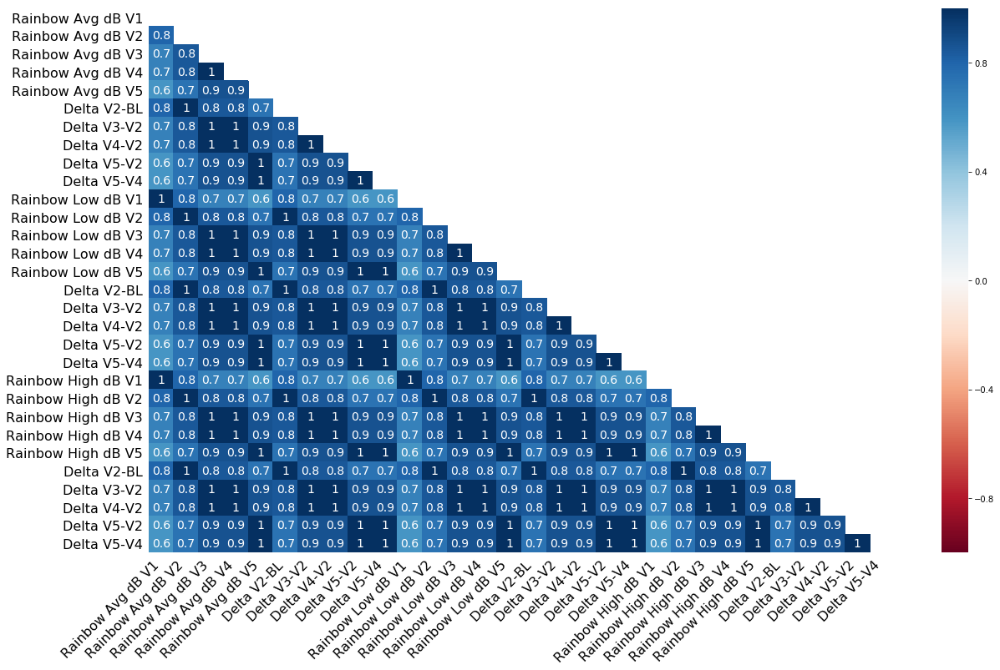

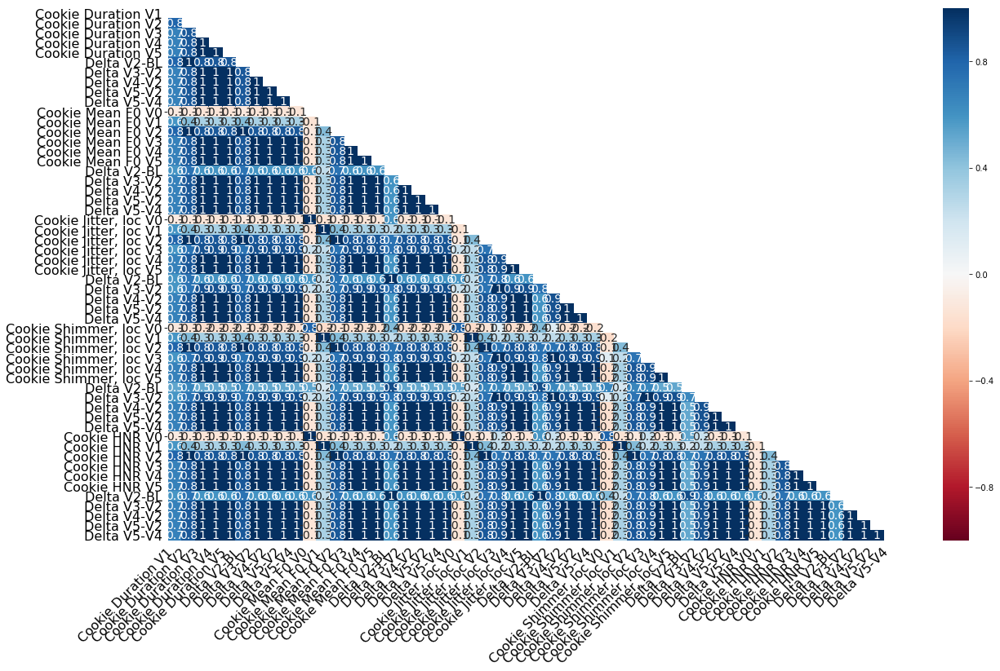

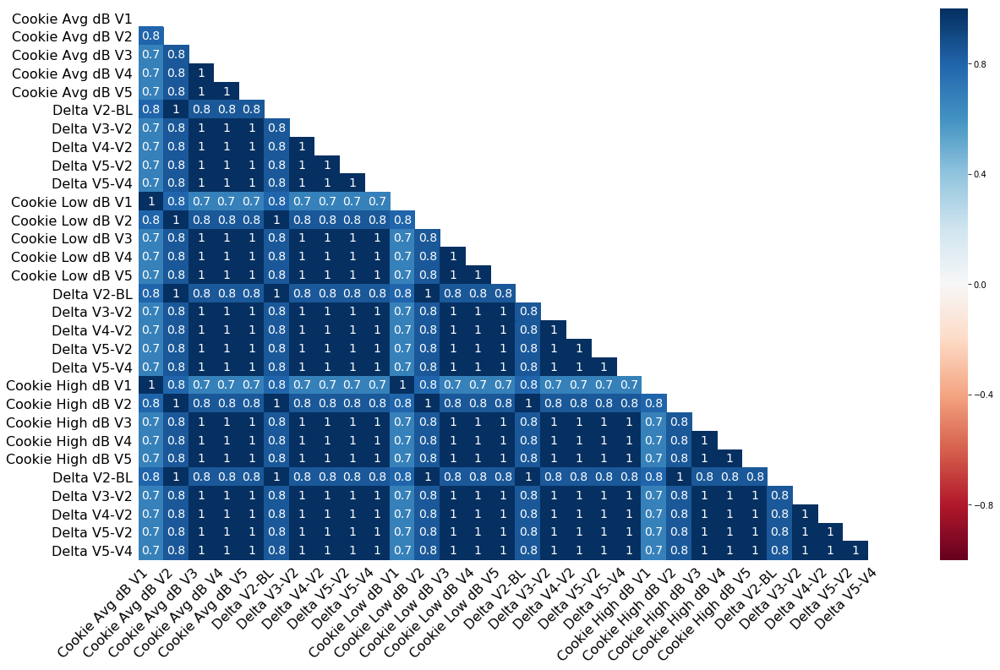

In [74]:
# msno.heatmap(amax_qual_mean)
# msno.heatmap(amax_db_mean)
# msno.heatmap(amin_qual_mean)
# msno.heatmap(amin_db_mean)

# msno.heatmap(emax_qual_mean)
# msno.heatmap(emax_db_mean)
# msno.heatmap(emin_qual_mean)
# msno.heatmap(emin_db_mean)

# msno.heatmap(rain_qual)
# msno.heatmap(rain_db)
# msno.heatmap(cookie_qual)
# msno.heatmap(cookie_db)

All data nullity correlation heatmap

All data nullity correlation heatmap

Examine missingno function documentation and reproduce the correlation computations into dataframe format for viewing

In [ ]:
# msno.heatmap(masterdf.iloc[:, 1:])

In [135]:
# nullity filter and sort included in missingno documentation but
# simply returns the dataframe when filter and sort are None
# df=msno.nullity_filter(masterdf.iloc[:, 1:], filter=None, n=0, p=0)
# df=msno.nullity_sort(df, sort=None, axis='rows')

In [137]:
# Remove completely filled or completely empty variables.
# df=df.iloc[:,[i for i, n in enumerate(np.var(df.isnull(), axis='rows')) if n > 0]]

# # Create and mask the correlation matrix. Construct the base heatmap.
# corr_mat=df.isnull().corr()
# mask=np.zeros_like(corr_mat)
# mask[np.triu_indices_from(mask)]=True

In [143]:
# low=0
# sig=0
# sig_coord=[]

# for i in range(corr_mat.shape[0]):
#     for j in range(corr_mat.shape[1]):
#         if corr_mat.iloc[i,j] < low:
#             low=corr_mat.iloc[i,j]
#         if corr_mat.iloc[i,j] < -0.6:
#             sig+=1
#             sig_coord.append([i,j])

In [139]:
# Don't rerun on startup, will mess up sizing and stuff
# corr_mat.to_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\VocalMeasures_Missingness_Corr.xlsx')

# Does treatment produce positive change in voice params?

First see if distributions are normal, apply tests just for A Max

Scipy: Kolmogorov-Smirnov, Shapiro-Wilks, D'Agostino

In [15]:
p1=stats.kstest(amax_dur_mean.loc[amax_dur_mean['First Intervention']=='D']['Delta V2-BL'], 'norm')
stat1, p2=stats.shapiro(amax_dur_mean.loc[amax_dur_mean['First Intervention']=='D']['Delta V2-BL'])
stat2, p3=stats.normaltest(amax_dur_mean.loc[amax_dur_mean['First Intervention']=='D']['Delta V2-BL'])
print(p1)
for p in (p2, p3):
    if p>0.05:
        print('p='+str(p)+'>0.05, fail to reject H0. Distribution appears to be normal')
    if p<0.05:
        print('p='+str(p)+'<0.05, reject H0. Distribution is not normal')

KstestResult(statistic=nan, pvalue=nan)
p=1.0>0.05, fail to reject H0. Distribution appears to be normal


C:\Users\kevin\Anaconda\lib\site-packages\scipy\stats\_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\Users\kevin\Anaconda\lib\site-packages\scipy\stats\_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\Users\kevin\Anaconda\lib\site-packages\scipy\stats\_distn_infrastructure.py:1748: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= self.b) & cond0
C:\Users\kevin\Anaconda\lib\site-packages\scipy\stats\_distn_infrastructure.py:1831: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)
C:\Users\kevin\Anaconda\lib\site-packages\scipy\stats\stats.py:1416: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=12
  "anyway, n=%i" % int(n))
C:\Users\kevin\Anaconda\lib\site-packages\scipy\stats\stats.py:1429: RuntimeWarning: invalid value encountered in sign
  term2 = np.sig

## Baseline Comparison

In [19]:
# Distribution determined to be normal. Apply parametric tests
ttest_ind_bl=pd.DataFrame(columns=['Variable', 'pval', 'S1 Mean', 'D1 Mean'])
wilcxn_sr_bl=pd.DataFrame(columns=['Variable', 'pval', 'S1 Mean', 'D1 Mean'])
count=0
twotail_vars=['Duration', 'Avg dB', 'High dB', 'Low dB', 'HNR', 'Jitter, loc', 'Shimmer, loc', 'Mean F0']

for meandf in meandflist:
    # First assign vars and slice to shorten code
    tempdf1=pd.DataFrame(columns=['Variable', 'pval', 'S1 Mean', 'D1 Mean'], index=[str(count)])
    tempdf2=pd.DataFrame(columns=['Variable', 'pval', 'S1 Mean', 'D1 Mean'], index=[str(count)])
    tempdf1['Variable']=meandf.columns[0]
    tempdf2['Variable']=meandf.columns[0]
    tempdf1['S1 Mean']=np.mean(meandf.loc[meandf['First Intervention']=='S'].iloc[:,2])
    tempdf2['S1 Mean']=np.mean(meandf.loc[meandf['First Intervention']=='S'].iloc[:,2])
    tempdf1['D1 Mean']=np.mean(meandf.loc[meandf['First Intervention']=='D'].iloc[:,2])
    tempdf2['D1 Mean']=np.mean(meandf.loc[meandf['First Intervention']=='D'].iloc[:,2])
    sbase=meandf.loc[meandf['First Intervention']=='S'][meandf.columns[0]+' V0']
    dbase=meandf.loc[meandf['First Intervention']=='D'][meandf.columns[0]+' V0']
    
    # Apply indeppendent t-test for comparisons between all groups, this one is two-sided. 
    # Extract 2-sided p val from all tests for statistical rigor
    # Will also apply wilcoxon-signed rank in case n=13 is too small to be considered parametric
    for i in twotail_vars:
        if meandf.columns[0][11:]==i or meandf.columns[0][7:]==i or meandf.columns[0][8:]==i:
            pval1=(stats.ttest_ind(sbase.dropna(), dbase.dropna()).pvalue)
            #pval1=(stats.ttest_ind(sbase, dbase)).pvalue
            #pval2=(stats.wilcoxon(sbase.dropna(), dbase.dropna()).pvalue)
            tempdf1['pval']=pval1
            #tempdf2['pval']=pval2
    
    ttest_ind_bl=pd.concat([ttest_ind_bl, tempdf1], sort=False)
    #wilcxn_sr_bl=pd.concat([wilcxn_sr_bl, tempdf2], sort=False)
    
    count+=1
    
# Apply Simes-Hochberg method to correct FDR: step-up method
# Add the true/false tuple as a column into the ttest bl dataframe
sh_bl=smt.multipletests(ttest_ind_bl.iloc[:, 1], alpha=0.05, method='sh')
ttest_ind_bl['pval']=sh_bl[1]
#ttest_ind_bl['reject H0']=sh_bl[0]
cols=['Variable', 'pval', 'S1 Mean', 'D1 Mean']
ttest_ind_bl=ttest_ind_bl.loc[:,cols]

In [69]:
# Don't rerun on startup, will mess up sizing and stuff
ttest_ind_bl.to_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\TTest_Independent_Baseline_4.xlsx')

## Start-end (BL-V5) comparison of raw values for S and D

Use paired t-test, obtain 2-tailed pval

In [17]:
# Original data:
S_se=pd.DataFrame(columns=['Variable', 'pval', 'BL Mean', 'V5 Mean'])
D_se=pd.DataFrame(columns=['Variable', 'pval', 'BL Mean', 'V5 Mean'])

count=1
for meandf in meandflist:
    varname=meandf.columns[0]
    S_raw=meandf.loc[meandf['First Intervention']=='S'].iloc[:, [2,7]]
    D_raw=meandf.loc[meandf['First Intervention']=='D'].iloc[:, [2,7]]
    # Make a list of temp dataframes to iterate thru
    S_temp=pd.DataFrame(columns=['Variable', 'pval', 'BL Mean', 'V5 Mean'], index=[str(count)])
    D_temp=pd.DataFrame(columns=['Variable', 'pval', 'BL Mean', 'V5 Mean'], index=[str(count)])
    tempdflist=[S_temp, D_temp]
    # Make list of dataframes with the data s1-d2 to correspond to the temp dfs
#     S_se_temp=S_raw.iloc[:, [2, 7]]
#     D_se_temp=D_raw.iloc[:, [2, 7]]
    sedflist=[S_raw, D_raw]

    for j in range(2):
        tempdf=tempdflist[j]
        tempvoice=sedflist[j]
        tempdf['Variable']=varname
        tempdf['pval']=stats.ttest_rel(tempvoice.iloc[:, 0], tempvoice.iloc[:, 1], nan_policy='omit').pvalue
        tempdf.iloc[:, 2]=np.mean(tempvoice.iloc[:, 0])
        tempdf.iloc[:, 3]=np.mean(tempvoice.iloc[:, 1])

        if j==0:            
            S_se=pd.concat([S_se, tempdf], sort=False)
        elif j==1:
            D_se=pd.concat([D_se, tempdf], sort=False)
    count+=1

In [18]:
# Do Simes-Hochberg FDR control for each of the groups
# S df
sh_s_df=smt.multipletests(S_se.iloc[:, 1], alpha=0.05, method='sh')
S_se['pval']=sh_s_df[1]
cols=['Variable', 'pval', 'BL Mean', 'V5 Mean']
S_se=S_se.loc[:,cols]

# D df
sh_d_df=smt.multipletests(D_se.iloc[:, 1], alpha=0.05, method='sh')
D_se['pval']=sh_d_df[1]
cols=['Variable', 'pval', 'BL Mean', 'V5 Mean']
D_se=D_se.loc[:,cols]

In [49]:
# Write dfs to excel
# *****Don't rerun on startup, will mess up sizing and highlights******
S_se.to_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\TTest_Paired_StartEnd_S.xlsx')
D_se.to_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\TTest_Paired_StartEnd_D.xlsx')

## Repeated measures ANOVA for all w/in group timepoint comparisons (Rainbow&Cookie min dB, UPDRS III)

4.28.21

Need to arrange data s.t. have ID, timepoint, and score in each row - i.e, Rainbow: 6 rows per participant (one for each data point from the 6 tps)

Rainbow min dB ANOVA

Rainbow mindB has patient ID 64922 missing data for V5, so remove from all tps.

In [19]:
#rain_mindb.drop(index=16, inplace=True)
id_S=list(rain_mindb.loc[rain_mindb['First Intervention']=='S']['ID'])*6
l_S=rain_mindb.loc[rain_mindb['First Intervention']=='S']['ID'].size

id_D=list(rain_mindb.loc[rain_mindb['First Intervention']=='D']['ID'])*6
l_D=rain_mindb.loc[rain_mindb['First Intervention']=='D']['ID'].size

rmin_adf_S=pd.DataFrame(columns=['ID','Week', 'score'])
rmin_adf_S['ID']=id_S

rmin_adf_D=pd.DataFrame(columns=['ID','Week', 'score'])
rmin_adf_D['ID']=id_D

rmin_adf_both=[rmin_adf_S, rmin_adf_D]
l_both=[l_S, l_D]
SD=['S', 'D']

for n in range(2):
    adf=rmin_adf_both[n]
    l=l_both[n]
    group=SD[n]
    for tp in range(2,8):
        adf.iloc[(tp-2)*l:(tp-1)*l, 1]=[(tp-2)*6]*l
        adf.iloc[(tp-2)*l:(tp-1)*l, 2]=list(rain_mindb.loc[rain_mindb['First Intervention']==group].iloc[:, tp])

In [20]:
#perform the repeated measures ANOVA
print("Rainbow min dB S group all comparisons ANOVA: ")
print(AnovaRM(data=rmin_adf_S, depvar='score', subject='ID', within=['Week']).fit())

print("Rainbow min dB D group all comparisons ANOVA: ")
print(AnovaRM(data=rmin_adf_D, depvar='score', subject='ID', within=['Week']).fit())

Rainbow min dB S group all comparisons ANOVA: 
              Anova
     F Value Num DF  Den DF Pr > F
----------------------------------
Week     nan 5.0000 60.0000    nan

Rainbow min dB D group all comparisons ANOVA: 
              Anova
     F Value Num DF  Den DF Pr > F
----------------------------------
Week 16.7969 5.0000 60.0000 0.0000



C:\Users\kevin\Downloads\Install\Programming\Anaconda\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
C:\Users\kevin\Downloads\Install\Programming\Anaconda\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
C:\Users\kevin\Downloads\Install\Programming\Anaconda\lib\site-packages\scipy\stats\_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Cookie min dB ANOVA

In [21]:
id_S=list(cookie_mindb.loc[cookie_mindb['First Intervention']=='S']['ID'])*6
l_S=cookie_mindb.loc[cookie_mindb['First Intervention']=='S']['ID'].size

id_D=list(cookie_mindb.loc[cookie_mindb['First Intervention']=='D']['ID'])*6
l_D=cookie_mindb.loc[cookie_mindb['First Intervention']=='D']['ID'].size

cmin_adf_S=pd.DataFrame(columns=['ID','Week', 'score'])
cmin_adf_S['ID']=id_S

cmin_adf_D=pd.DataFrame(columns=['ID','Week', 'score'])
cmin_adf_D['ID']=id_D

cmin_adf_both=[cmin_adf_S, cmin_adf_D]
l_both=[l_S, l_D]
SD=['S', 'D']

for n in range(2):
    adf=cmin_adf_both[n]
    l=l_both[n]
    group=SD[n]
    for tp in range(2,8):
        adf.iloc[(tp-2)*l:(tp-1)*l, 1]=[(tp-2)*6]*l
        adf.iloc[(tp-2)*l:(tp-1)*l, 2]=list(cookie_mindb.loc[cookie_mindb['First Intervention']==group].iloc[:, tp])

In [22]:
#perform the repeated measures ANOVA
print("Cookie min dB S group all comparisons ANOVA: ")
print(AnovaRM(data=cmin_adf_S, depvar='score', subject='ID', within=['Week']).fit())

print("Cookie min dB D group all comparisons ANOVA: ")
print(AnovaRM(data=cmin_adf_D, depvar='score', subject='ID', within=['Week']).fit())

Cookie min dB S group all comparisons ANOVA: 
              Anova
     F Value Num DF  Den DF Pr > F
----------------------------------
Week 15.7061 5.0000 60.0000 0.0000

Cookie min dB D group all comparisons ANOVA: 
              Anova
     F Value Num DF  Den DF Pr > F
----------------------------------
Week  8.5867 5.0000 60.0000 0.0000



UPDRS Subscore III ANOVA

In [23]:
id_S=list(mdsdf.loc[mdsdf['First Intervention']=='S']['ID'])*6
l_S=mdsdf.loc[mdsdf['First Intervention']=='S']['ID'].size

id_D=list(mdsdf.loc[mdsdf['First Intervention']=='D']['ID'])*6
l_D=mdsdf.loc[mdsdf['First Intervention']=='D']['ID'].size

mds_adf_S=pd.DataFrame(columns=['ID','Week', 'score'])
mds_adf_S['ID']=id_S

mds_adf_D=pd.DataFrame(columns=['ID','Week', 'score'])
mds_adf_D['ID']=id_D

mds_adf_both=[mds_adf_S, mds_adf_D]
l_both=[l_S, l_D]
SD=['S', 'D']

for n in range(2):
    adf=mds_adf_both[n]
    l=l_both[n]
    group=SD[n]
    for tp in range(2,8):
        adf.iloc[(tp-2)*l:(tp-1)*l, 1]=[(tp-2)*6]*l
        adf.iloc[(tp-2)*l:(tp-1)*l, 2]=list(mdsdf.loc[mdsdf['First Intervention']==group].iloc[:, tp-1])

In [24]:
#perform the repeated measures ANOVA
print("MDS-UPDRS Subscore III S group all comparisons ANOVA: ")
print(AnovaRM(data=mds_adf_S, depvar='score', subject='ID', within=['Week']).fit())

print("MDS-UPDRS Subscore III D group all comparisons ANOVA: ")
print(AnovaRM(data=mds_adf_D, depvar='score', subject='ID', within=['Week']).fit())

MDS-UPDRS Subscore III S group all comparisons ANOVA: 
              Anova
     F Value Num DF  Den DF Pr > F
----------------------------------
Week  5.3882 5.0000 60.0000 0.0004

MDS-UPDRS Subscore III D group all comparisons ANOVA: 
              Anova
     F Value Num DF  Den DF Pr > F
----------------------------------
Week  3.1668 5.0000 60.0000 0.0133



## Comparing men and women in total cohort for Rainbow, Cookie, UPDRS

6.15.21 3 subplots of all participants split into men vs women for the 3 outcome measures

In [ ]:
timepoints=['Week 0', 'Week 6', 'Week 12', 'Week 18', 'Week 24', 'Week 30']
a=rain_mindb
b=cookie_mindb
c=mdf

In [121]:
F_ID=IDdf.loc[IDdf['Gender']=='F']['ID']
M_ID=IDdf.loc[IDdf['Gender']=='M']['ID']

a['Gender']='M'
for i in a['ID']:
    for j in F_ID:
        if i==float(j):
            a.loc[a['ID']==i, 'Gender']='F'
            
b['Gender']='M'
for i in b['ID']:
    for j in F_ID:
        if i==float(j):
            b.loc[b['ID']==i, 'Gender']='F'
            
c['Gender']='M'
for i in c['ID']:
    for j in F_ID:
        if i==float(j):
            c.loc[c['ID']==i, 'Gender']='F'

In [151]:
a_f=a[a['Gender']=='F'].iloc[:, 2:8]
a_m=a[a['Gender']=='M'].iloc[:, 2:8]

b_f=b[b['Gender']=='F'].iloc[:, 2:8]
b_m=b[b['Gender']=='M'].iloc[:, 2:8]

c_f=c[c['Gender']=='F'].iloc[:, 1:7]
c_m=c[c['Gender']=='M'].iloc[:, 1:7]

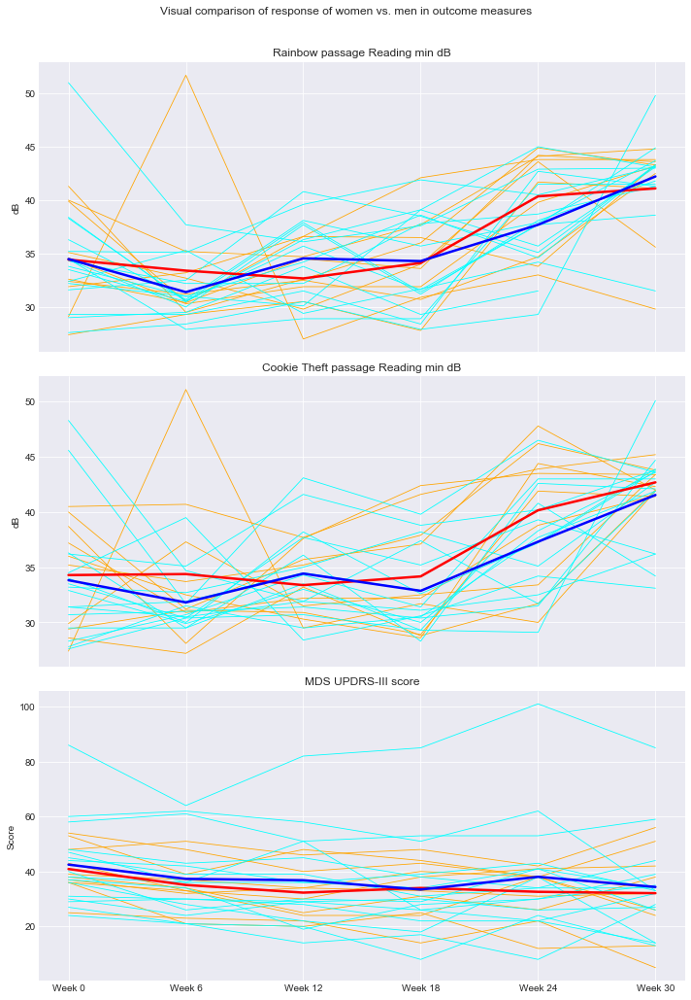

In [156]:
fig, (ax1, ax2, ax3)=plt.subplots(3,1)
fig.suptitle('Visual comparison of response of women vs. men in outcome measures')

# Subplot 1: Rainbow min dB
# plot F first, then another loop for M
# add a line for each sex which reps the avg for that group
for patient in range(F_ID.size):
    plotA_f=a_f.iloc[patient]
    ax1.plot(timepoints, plotA_f, marker='', color='orange', linewidth=0.8)
for patient in range(M_ID.size):
    plotA_m=a_m.iloc[patient]
    ax1.plot(timepoints, plotA_m, marker='', color='cyan', linewidth=0.8)
    
# Plot mean of all female/male patients for this measure
ax1.plot(timepoints, a_f.mean(axis=0), marker='', color='red', linewidth=2.5)
ax1.plot(timepoints, a_m.mean(axis=0), marker='', color='blue', linewidth=2.5)

# Format
ax1.grid(True)
ax1.set_ylabel('dB')
ax1.set_xticklabels([])
fig.set_size_inches(10,15)
ax1.title.set_text('Rainbow passage Reading min dB')

# Subplot 2: Cookie min dB
# plot F first, then another loop for M
# add a line for each sex which reps the avg for that group
for patient in range(F_ID.size):
    plotB_f=b_f.iloc[patient]
    ax2.plot(timepoints, plotB_f, marker='', color='orange', linewidth=0.8)
for patient in range(M_ID.size):
    plotB_m=b_m.iloc[patient]
    ax2.plot(timepoints, plotB_m, marker='', color='cyan', linewidth=0.8)
    
# Plot mean of all female/male patients for this measure
ax2.plot(timepoints, b_f.mean(axis=0), marker='', color='red', linewidth=2.5)
ax2.plot(timepoints, b_m.mean(axis=0), marker='', color='blue', linewidth=2.5)

# Format
ax2.grid(True)
ax2.set_ylabel('dB')
ax2.set_xticklabels([])
fig.set_size_inches(10,15)
ax2.title.set_text('Cookie Theft passage Reading min dB')

# Subplot 3: UPDRS III
# plot F first, then another loop for M
# add a line for each sex which reps the avg for that group
for patient in range(F_ID.size):
    plotC_f=c_f.iloc[patient]
    ax3.plot(timepoints, plotC_f, marker='', color='orange', linewidth=0.8)
for patient in range(M_ID.size):
    plotC_m=c_m.iloc[patient]
    ax3.plot(timepoints, plotC_m, marker='', color='cyan', linewidth=0.8)
    
# Plot mean of all female/male patients for this measure
ax3.plot(timepoints, c_f.mean(axis=0), marker='', color='red', linewidth=2.5)
ax3.plot(timepoints, c_m.mean(axis=0), marker='', color='blue', linewidth=2.5)

# Format
ax3.grid(True)
ax3.set_ylabel('Score')
ax3.set_xticklabels([])
fig.set_size_inches(10,15)
ax3.title.set_text('MDS UPDRS-III score')
ax3.set_xticklabels(['Week 0', 'Week 6', 'Week 12', 'Week 18', 'Week 24', 'Week 30'])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
currentfig=plt.gcf()

In [157]:
currentfig.savefig(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\Manuscript\Figures\Fig_6152021.tif', dpi=300)

## Dependent sample t-testing for all w/in group timepoint comparisons (Rainbow&Cookie min dB, UPDRS III) and between-group t-test at BL

4.28.21

In [19]:
# Make a list which contains all of the combinations of timepoints for the columns of the results df
col_list=['Measure: Group', 'S vs. D']
for a in range(5):
    c=a+1
    for b in range(c,6):
        col_list.append('Week '+str(a*6)+' vs. Week '+str(b*6))
minresults_df=pd.DataFrame(columns=col_list)
minresults_df['Measure: Group']=['Rainbow min dB: S', 'Rainbow min dB: D', 'Cookie min dB: S', 'Cookie min dB: D', 'UPDRS III: S', 'UPDRS III: D']

# Perform within-group related sample t-tests using same loop structure as before
dflist=[rain_mindb.drop(columns=['Rainbow Low dB']).loc[rain_mindb['First Intervention']=='S'], rain_mindb.drop(columns=['Rainbow Low dB']).loc[rain_mindb['First Intervention']=='D']
        ,cookie_mindb.drop(columns=['Cookie Low dB']).loc[cookie_mindb['First Intervention']=='S'], cookie_mindb.drop(columns=['Cookie Low dB']).loc[cookie_mindb['First Intervention']=='D']
        ,mdsdf.loc[mdsdf['First Intervention']=='S'], mdsdf.loc[mdsdf['First Intervention']=='D']]
for i in range(6):
    df=dflist[i]
    for a in range(5):
        c=a+1
        for b in range(c,6):
            # S all comparisons
            minresults_df['Week '+str(a*6)+' vs. Week '+str(b*6)][i]=stats.ttest_rel(df.iloc[:,a+1], df.iloc[:,b+1]).pvalue
            # D all comparisons
            minresults_df['Week '+str(a*6)+' vs. Week '+str(b*6)][i]=stats.ttest_rel(df.iloc[:,a+1], df.iloc[:,b+1]).pvalue

# Perform between-group indep sample t-tests for baseline comparisons            
for i in [0,2,4]:
    minresults_df['S vs. D'][i]=stats.ttest_ind(dflist[i].iloc[:,1], dflist[i+1].iloc[:,1]).pvalue
    minresults_df['S vs. D'][i+1]=minresults_df['S vs. D'][i]

C:\Users\kevin\Downloads\Install\Programming\Anaconda\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
C:\Users\kevin\Downloads\Install\Programming\Anaconda\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
C:\Users\kevin\Downloads\Install\Programming\Anaconda\lib\site-packages\scipy\stats\_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


In [299]:
# uncorrected
# minresults_df.to_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\AllComparisons_uncorrected.xlsx')

In [22]:
# minresults_df

,Measure: Group,S vs. D,Week 0 vs. Week 6,Week 0 vs. Week 12,Week 0 vs. Week 18,Week 0 vs. Week 24,Week 0 vs. Week 30,Week 6 vs. Week 12,Week 6 vs. Week 18,Week 6 vs. Week 24,Week 6 vs. Week 30,Week 12 vs. Week 18,Week 12 vs. Week 24,Week 12 vs. Week 30,Week 18 vs. Week 24,Week 18 vs. Week 30,Week 24 vs. Week 30
0,Rainbow min dB: S,0.00367378,0.893987,0.163331,0.568351,0.00206408,NaN,0.562191,0.854815,0.0597884,NaN,0.349697,0.0552999,NaN,0.0250874,NaN,NaN
1,Rainbow min dB: D,0.00367378,0.00281975,0.0627359,0.449168,0.0114006,0.00826123,0.118032,0.00890106,4.45343e-05,2.63024e-05,0.120703,0.00031789,3.23868e-06,0.0017283,0.000278404,0.300719
2,Cookie min dB: S,0.000728544,0.358455,0.000419781,0.0534403,0.000174373,2.37256e-06,0.583179,0.713307,0.061358,0.000227328,0.038002,0.0103247,6.35597e-05,0.00160759,8.7187e-06,0.0290258
3,Cookie min dB: D,0.000728544,0.040037,0.0600356,0.0861132,0.29933,0.0273285,0.481536,0.309158,0.0143257,0.000141315,0.632489,0.00323249,2.64906e-05,0.0229321,0.000119272,0.180956
4,UPDRS III: S,0.896945,0.02889,0.00240382,0.00171236,0.013006,0.00363298,0.0247722,0.0127149,0.507798,0.017689,0.824888,0.237614,0.306034,0.182844,0.20933,0.10394
5,UPDRS III: D,0.896945,0.000835601,0.00120028,0.000130574,0.0238538,0.027142,0.627126,0.589115,0.968051,0.598516,0.333792,0.737534,0.923275,0.568733,0.23429,0.694578


Do Simes-Hochberg FDR control for all 96 comparisons (most stringent for now, ask Alex/Bela - 4.28.21)

In [199]:
# Make a list of all of the results p-values by concatenating the 16 columns vertically
results_vals=[]
for i in range(1,17):
    a=list(results_df.iloc[:,i])
    for j in a:
        results_vals.append(j)

In [200]:
# Perform the correction
sh_results=smt.multipletests(results_vals, alpha=0.05, method='sh')

# Unpack the list of pvals back into the 16 columns (order was preserved)
results_vals=sh_results[1]
for i in range(1,17):
    results_df.iloc[:,i]=results_vals[(i-1)*6:i*6]


In [205]:
# Don't rerun on startup, will mess up sizing and stuff
# results_df.to_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\AllComparisons_1.xlsx')

Same analysis but for the Rainbow, Cookie avg dB

In [59]:
# Make a list which contains all of the combinations of timepoints for the columns of the results df
col_list=['Measure: Group', 'S vs. D']
for a in range(5):
    c=a+1
    for b in range(c,6):
        col_list.append('Week '+str(a*6)+' vs. Week '+str(b*6))
avgresults_df=pd.DataFrame(columns=col_list)
avgresults_df['Measure: Group']=['Rainbow avg dB: S', 'Rainbow avg dB: D', 'Cookie avg dB: S', 'Cookie avg dB: D']

# Perform within-group related sample t-tests using same loop structure as before
dflist=[rain_avgdb.drop(columns=['Rainbow Avg dB']).loc[rain_avgdb['First Intervention']=='S'], rain_avgdb.drop(columns=['Rainbow Avg dB']).loc[rain_avgdb['First Intervention']=='D']
        ,cookie_avgdb.drop(columns=['Cookie Avg dB']).loc[cookie_avgdb['First Intervention']=='S'], cookie_avgdb.drop(columns=['Cookie Avg dB']).loc[cookie_avgdb['First Intervention']=='D']]
for i in range(4):
    df=dflist[i]
    for a in range(5):
        c=a+1
        for b in range(c,6):
            # S all comparisons
            avgresults_df['Week '+str(a*6)+' vs. Week '+str(b*6)][i]=stats.ttest_rel(df.iloc[:,a+1], df.iloc[:,b+1]).pvalue
            # D all comparisons
            avgresults_df['Week '+str(a*6)+' vs. Week '+str(b*6)][i]=stats.ttest_rel(df.iloc[:,a+1], df.iloc[:,b+1]).pvalue

# Perform between-group indep sample t-tests for baseline comparisons            
for i in [0,2]:
    avgresults_df['S vs. D'][i]=stats.ttest_ind(dflist[i].iloc[:,1], dflist[i+1].iloc[:,1]).pvalue
    avgresults_df['S vs. D'][i+1]=avgresults_df['S vs. D'][i]

In [60]:
avgresults_df

,Measure: Group,S vs. D,Week 0 vs. Week 6,Week 0 vs. Week 12,Week 0 vs. Week 18,Week 0 vs. Week 24,Week 0 vs. Week 30,Week 6 vs. Week 12,Week 6 vs. Week 18,Week 6 vs. Week 24,Week 6 vs. Week 30,Week 12 vs. Week 18,Week 12 vs. Week 24,Week 12 vs. Week 30,Week 18 vs. Week 24,Week 18 vs. Week 30,Week 24 vs. Week 30
0,Rainbow avg dB: S,0.034416,0.965799,0.124437,0.618297,0.260694,0.0708326,0.345936,0.626209,0.311258,0.238205,0.10805,0.0587242,0.0061069,0.322933,0.181173,0.440457
1,Rainbow avg dB: D,0.034416,0.0319894,0.914659,0.774204,0.516845,0.80707,0.0262965,0.00918629,0.0116639,0.0364422,0.678498,0.375853,0.726094,0.756882,0.978609,0.863728
2,Cookie avg dB: S,0.00942343,0.402774,0.796313,0.39247,0.00930556,0.00217032,0.334403,0.782526,0.0422229,0.00849393,0.24823,0.0117145,0.00338827,0.00235354,0.000761114,0.236964
3,Cookie avg dB: D,0.00942343,0.141324,0.487148,0.719361,0.219943,0.909546,0.241743,0.055297,0.0138546,0.281626,0.56954,0.0815757,0.701777,0.162734,0.890466,0.394056


In [61]:
# Don't rerun on startup, will mess up sizing and stuff
# avgresults_df.to_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\AllComparisons_AVG_1.xlsx')

## Effect Size Calculations

D Group, delta from singing vs delta from discussion in Rainbow, Cookie, min and avg dB

In [84]:
# function to calculate Cohen's d for independent samples
def cohend(d1, d2):
    # calculate the size of samples
    n1, n2 = len(d1), len(d2)
    # calculate the variance of the samples
    s1, s2 = np.var(d1, ddof=1), np.var(d2, ddof=1)
    # calculate the pooled standard deviation
    s = np.sqrt(((n1 - 1) * s1 + (n2 - 1) * s2) / (n1 + n2 - 2))
    # calculate the means of the samples
    u1, u2 = np.mean(d1), np.mean(d2)
    # calculate the effect size
    return (u1 - u2) / s

In [98]:
esdf=pd.DataFrame(columns=['Measure', 'Cohen\'s D'], index=range(4))
esdf['Measure']=['Rainbow min dB', 'Cookie min dB', 'Rainbow avg dB', 'Cookie avg dB']

esdf['Cohen\'s D'][0]=cohend(rain_mindb.loc[rain_mindb['First Intervention']=='D']['Delta V2-BL'], rain_mindb.loc[rain_mindb['First Intervention']=='D']['Delta V4-V2'])
esdf['Cohen\'s D'][1]=cohend(rain_avgdb.loc[rain_avgdb['First Intervention']=='D']['Delta V2-BL'], rain_avgdb.loc[rain_avgdb['First Intervention']=='D']['Delta V4-V2'])
esdf['Cohen\'s D'][2]=cohend(cookie_mindb.loc[cookie_mindb['First Intervention']=='D']['Delta V2-BL'], cookie_mindb.loc[cookie_mindb['First Intervention']=='D']['Delta V4-V2'])
esdf['Cohen\'s D'][3]=cohend(cookie_avgdb.loc[cookie_avgdb['First Intervention']=='D']['Delta V2-BL'], cookie_avgdb.loc[cookie_avgdb['First Intervention']=='D']['Delta V4-V2'])

In [99]:
esdf

,Measure,Cohen's D
0,Rainbow min dB,-1.88944
1,Cookie min dB,-0.26029
2,Rainbow avg dB,-1.57244
3,Cookie avg dB,-0.695419


# Pre-post comparison of raw values for each group (S1, D1, S2, D2)

For S1: Compare V0 and V2, raw values, generate 1 table 

For S2: V2-V4, D1: V0-V2, D2: V2-V4

Using paired t-test since comparing same subjects separated by 2 timepoints

Extract 2-tailed pval

In [21]:
# Create 4 initial dfs to append to within each loop.
s1_df=pd.DataFrame(columns=['Variable', 'pval', 'BL Mean', 'V2 Mean'])
s2_df=pd.DataFrame(columns=['Variable', 'pval', 'V2 Mean', 'V4 Mean'])
d1_df=pd.DataFrame(columns=['Variable', 'pval', 'BL Mean', 'V2 Mean'])
d2_df=pd.DataFrame(columns=['Variable', 'pval', 'V2 Mean', 'V4 Mean'])
groupsdflist=[s1_df, s2_df, d1_df, d2_df]

# Loop thru meandflist and append comparisons for each variable to the 4 dataframes
count=0
for meandf in meandflist:
    varname=meandf.columns[0]
    if varname[:6]=='Cookie':
        meandf=meandf.drop([2,14], axis=0)
        if varname[7:]=='Shimmer, loc':
            meandf=meandf.drop([18], axis=0)
    # Create temp dfs to append to final dfs later on
    s1_temp=pd.DataFrame(columns=['Variable', 'pval', 'BL Mean', 'V2 Mean'], index=[str(count)])
    s2_temp=pd.DataFrame(columns=['Variable', 'pval', 'V2 Mean', 'V4 Mean'], index=[str(count)])
    d1_temp=pd.DataFrame(columns=['Variable', 'pval', 'BL Mean', 'V2 Mean'], index=[str(count)])
    d2_temp=pd.DataFrame(columns=['Variable', 'pval', 'V2 Mean', 'V4 Mean'], index=[str(count)])
    tempdflist=[s1_temp, s2_temp, d1_temp, d2_temp]
    
    # Isolate dfs for each group
    s1_raw=meandf.loc[meandf['First Intervention']=='S'].iloc[:, 2:5]
    s2_raw=meandf.loc[meandf['First Intervention']=='S'].iloc[:, 4:7]
    d1_raw=meandf.loc[meandf['First Intervention']=='D'].iloc[:, 2:5]
    d2_raw=meandf.loc[meandf['First Intervention']=='D'].iloc[:, 4:7]
    rawdflist=[s1_raw, s2_raw, d1_raw, d2_raw]
    
    # Assign
    for i in range(4):
        tempdf=tempdflist[i]
        rawdf=rawdflist[i]
        tempdf['Variable']=varname
        tempdf['pval']=stats.ttest_rel(rawdf.iloc[:, 0], rawdf.iloc[:, 2]).pvalue
        tempdf.iloc[:, 2]=np.mean(rawdf.iloc[:, 0])
        tempdf.iloc[:, 3]=np.mean(rawdf.iloc[:, 2])
        
        if i==0:
            s1_df=pd.concat([s1_df, tempdf], sort=False)
        elif i==1:
            s2_df=pd.concat([s2_df, tempdf], sort=False)
        elif i==2:
            d1_df=pd.concat([d1_df, tempdf], sort=False)
        elif i==3:
            d2_df=pd.concat([d2_df, tempdf], sort=False)
        
    count+=1
    

In [22]:
# Do Simes-Hochberg FDR control for each of the groups
# S1 df
sh_s1_df=smt.multipletests(s1_df.iloc[:, 1], alpha=0.05, method='sh')
s1_df['pval']=sh_s1_df[1]
cols=['Variable', 'pval', 'BL Mean', 'V2 Mean']
s1_df=s1_df.loc[:,cols]

# S2 df
sh_s2_df=smt.multipletests(s2_df.iloc[:, 1], alpha=0.05, method='sh')
s2_df['pval']=sh_s2_df[1]
cols=['Variable', 'pval', 'V2 Mean', 'V4 Mean']
s2_df=s2_df.loc[:,cols]

# D1 df
sh_d1_df=smt.multipletests(d1_df.iloc[:, 1], alpha=0.05, method='sh')
d1_df['pval']=sh_d1_df[1]
cols=['Variable', 'pval', 'BL Mean', 'V2 Mean']
d1_df=d1_df.loc[:,cols]

# D2 df
sh_d2_df=smt.multipletests(d2_df.iloc[:, 1], alpha=0.05, method='sh')
d2_df['pval']=sh_d2_df[1]
cols=['Variable', 'pval', 'V2 Mean', 'V4 Mean']
d2_df=d2_df.loc[:,cols]


In [73]:
# Write dfs to excel
# *****Don't rerun on startup, will mess up sizing and highlights******
s1_df.to_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\TTest_Paired_Groupwise_S1_4.xlsx')
s2_df.to_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\TTest_Paired_Groupwise_S2_4.xlsx')
d1_df.to_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\TTest_Paired_Groupwise_D1_4.xlsx')
d2_df.to_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\TTest_Paired_Groupwise_D2_4.xlsx')

In [159]:
# Loop to perform tests on one variable at a time
# Distribution determined to be normal. Apply parametric tests
ttest_ind_df=pd.DataFrame(columns=['Variable', 'Singing first', 'Discussion first'])
wilcxn_sr_df=pd.DataFrame(columns=['Variable', 'Singing first', 'Discussion first'])
count=0
#twotail_vars=['Duration', 'Avg dB', 'High dB', 'Low dB', 'HNR', 'Jitter, loc', 'Shimmer, loc', 'Mean F0']

for meandf in meandflist:
    varname=meandf.columns[0]
    if varname[:6]=='Cookie':
        meandf=meandf.drop([2,14], axis=0)
        if varname[7:]=='Shimmer, loc':
            meandf=meandf.drop([18], axis=0)
    # First assign vars and slice to shorten code
    tempdf1=pd.DataFrame(columns=['Variable', 'Singing first', 'Discussion first'], index=[str(count)])
    tempdf1['Variable']=meandf.columns[0]
  
    d1delta=meandf.loc[meandf['First Intervention']=='D']['Delta V2-BL'].astype(float)
    s1delta=meandf.loc[meandf['First Intervention']=='S']['Delta V2-BL'].astype(float)
    s2delta=meandf.loc[meandf['First Intervention']=='S']['Delta V4-V2'].astype(float)
    d2delta=meandf.loc[meandf['First Intervention']=='D']['Delta V4-V2'].astype(float)
    
    # Apply independent t-test for comparisons between all groups, this one is two-sided. 
    # Extract 2-sided p val from all tests for statistical rigor
    # Will also apply wilcoxon-signed rank in case n=13 is too small to be considered parametric
    spval=(stats.ttest_ind(s1delta, s2delta).pvalue)
    dpval=(stats.ttest_ind(d1delta, d2delta).pvalue)
   
    tempdf1['Singing first']=spval
    tempdf1['Discussion first']=dpval

    ttest_ind_df=pd.concat([ttest_ind_df, tempdf1], sort=False)
    #wilcxn_sr_df=pd.concat([wilcxn_sr_df, tempdf2], sort=False)
    
    count+=1

In [166]:
# Do Simes-Hochberg FDR control
sh_s_df=smt.multipletests(ttest_ind_df.iloc[:, 1], alpha=0.05, method='sh')
sh_d_df=smt.multipletests(ttest_ind_df.iloc[:, 2], alpha=0.05, method='sh')
ttest_ind_df['Singing first']=sh_s_df[1]
ttest_ind_df['Discussion first']=sh_d_df[1]

cols=['Variable', 'Singing first', 'Discussion first']
ttest_ind_df=ttest_ind_df.loc[:,cols]

In [165]:
# Write ttest and wilcxn dfs to Excel sheets for easy future viewing
ttest_ind_df.to_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\TTest_Independent_Results_5.xlsx')
#wilcxn_sr_df.to_excel(r'C:\Users\kevin\Documents\JHU\Labs\Parkinsonics\Wilcoxon_SR_Results.xlsx')

## Determining lasting/sustained change - does change from singing intervention persist remain in the weeks after intervention stops?

i.e, do significantly improved measures as a result of singing stay significantly diff from pre-singing

For S group: compare BL to V3, V4 and V5

For D group: compare V2 to V4, V5

Paired t-test since working within-group, obtain 2-tailed p val

In [20]:
s_lasting=pd.DataFrame(columns=['Variable', 'p: BL vs. V3', 'p: BL vs. V4', 'p: BL vs. V5', 'delta: BL to V3', 'delta: BL to V4', 'delta: BL to V5'])
d_lasting=pd.DataFrame(columns=['Variable', 'p: V2 vs. V4', 'p: V2 vs. V5', 'delta: V2 to V4', 'delta: V2 to V5'])

count=0
for meandf in meandflist:
    varname=meandf.columns[0]
    tempdf=meandf
    if varname[:10]=='E Speaking':
        tempdf=tempdf.drop([15], axis=0)
    if varname=='Rainbow Mean F0' or varname=='Rainbow Shimmer, loc' or varname=='Rainbow Jitter, loc' or varname=='Rainbow HNR':
        tempdf=tempdf.drop([8], axis=0)
    if varname=='Rainbow Avg dB' or varname=='Rainbow Low dB' or varname=='Rainbow High dB':
        tempdf=tempdf.drop([16], axis=0)
    if varname=='Cookie Mean F0' or varname=='Cookie Jitter, loc' or varname=='Cookie HNR':
        tempdf=tempdf.drop([2,14], axis=0)
    if varname=='Cookie Shimmer, loc':
        tempdf=tempdf.drop([2,14,18], axis=0)
            
    # Isolate groups in meandf
    sdf=tempdf.loc[tempdf['First Intervention']=='S']
    ddf=tempdf.loc[tempdf['First Intervention']=='D']
    
    # Create temp dfs to append to final dfs later on
    s_temp=pd.DataFrame(columns=['Variable', 'p: BL vs. V3', 'p: BL vs. V4', 'p: BL vs. V5', 'delta: BL to V3', 'delta: BL to V4', 'delta: BL to V5'], index=[str(count)])
    d_temp=pd.DataFrame(columns=['Variable', 'p: V2 vs. V4', 'p: V2 vs. V5', 'delta: V2 to V4', 'delta: V2 to V5'], index=[str(count)])
    
    s_temp['Variable']=varname
    d_temp['Variable']=varname
    
    s_temp['p: BL vs. V3']=stats.ttest_rel(sdf.iloc[:, 2], sdf.iloc[:, 5]).pvalue
    s_temp['p: BL vs. V4']=stats.ttest_rel(sdf.iloc[:, 2], sdf.iloc[:, 6]).pvalue
    s_temp['p: BL vs. V5']=stats.ttest_rel(sdf.iloc[:, 2], sdf.iloc[:, 7]).pvalue
    d_temp['p: V2 vs. V4']=stats.ttest_rel(ddf.iloc[:, 4], ddf.iloc[:, 6]).pvalue
    d_temp['p: V2 vs. V5']=stats.ttest_rel(ddf.iloc[:, 4], ddf.iloc[:, 7]).pvalue
    s_temp['delta: BL to V3']=np.mean(sdf.iloc[:, 5])-np.mean(sdf.iloc[:, 2])
    s_temp['delta: BL to V4']=np.mean(sdf.iloc[:, 6])-np.mean(sdf.iloc[:, 2])
    s_temp['delta: BL to V5']=np.mean(sdf.iloc[:, 7])-np.mean(sdf.iloc[:, 2])
    d_temp['delta: V2 to V4']=np.mean(ddf.iloc[:, 6])-np.mean(ddf.iloc[:, 4])
    d_temp['delta: V2 to V5']=np.mean(ddf.iloc[:, 7])-np.mean(ddf.iloc[:, 4])
    
    
    s_lasting=pd.concat([s_lasting, s_temp], sort=False)
    d_lasting=pd.concat([d_lasting, d_temp], sort=False)
        
    count+=1

Correct both s and d lasting dfs for multiple comparisons

In [21]:
# Do Simes-Hochberg FDR control for each of the groups
# S correction: need to do it for 3 cols
sh_s_1=smt.multipletests(s_lasting.iloc[:, 1], alpha=0.05, method='sh')
sh_s_2=smt.multipletests(s_lasting.iloc[:, 2], alpha=0.05, method='sh')
sh_s_3=smt.multipletests(s_lasting.iloc[:, 3], alpha=0.05, method='sh')
s_lasting['p: BL vs. V3']=sh_s_1[1]
s_lasting['p: BL vs. V4']=sh_s_2[1]
s_lasting['p: BL vs. V5']=sh_s_3[1]

# D corrections: 2 cols
sh_d_1=smt.multipletests(d_lasting.iloc[:, 1], alpha=0.05, method='sh')
sh_d_2=smt.multipletests(d_lasting.iloc[:, 2], alpha=0.05, method='sh')
d_lasting['p: V2 vs. V4']=sh_d_1[1]
d_lasting['p: V2 vs. V5']=sh_d_2[1]

In [27]:
# Write ttest and wilcxn dfs to Excel sheets for easy future viewing
s_lasting.to_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\TTest_SLasting_1.xlsx')
d_lasting.to_excel(r'C:\Users\kevin\Documents\JHU\Research\Parkinsonics\TTest_DLasting_1.xlsx')

## Rainbow, Cookie Low dB all-timepoints comparisons

Checking for significant differences between all possible pairings of timepoints w/in both groups.

The only inter-group comparison will be at BL

BL between-group comparison

In [27]:
count=0

rain_alltp=pd.DataFrame(columns=[''])
rain_S=rain_mindb.loc[rain_mindb['First Intervention']=='S']
rain_D=rain_mindb.loc[rain_mindb['First Intervention']=='D']
stats.ttest_rel(rain_S.iloc[:, 2], rain_D.iloc[:, 2]).pvalue

0.009536650030904478

## Groupwise Gradient and Boxplots

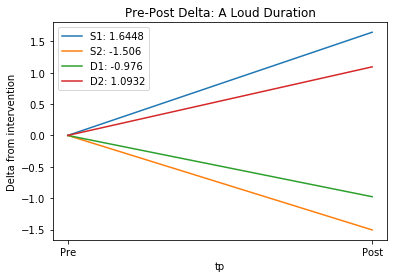

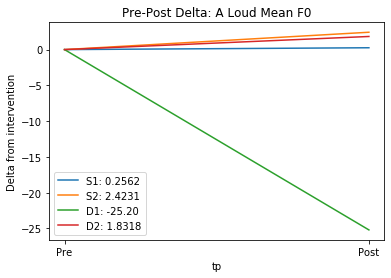

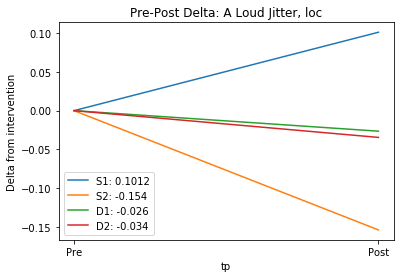

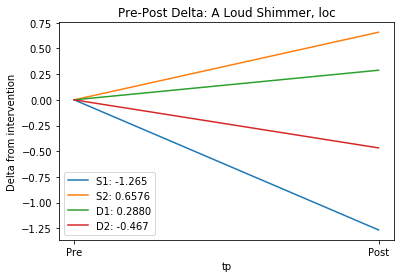

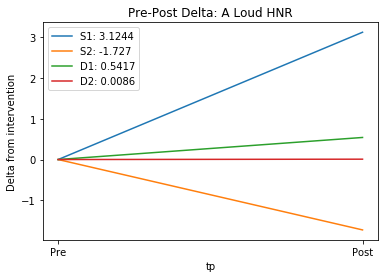

...

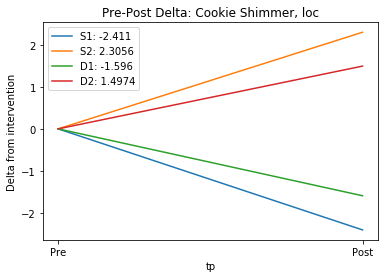

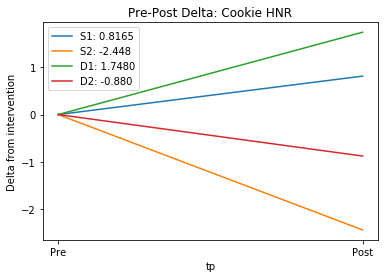

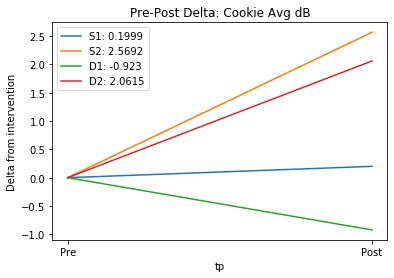

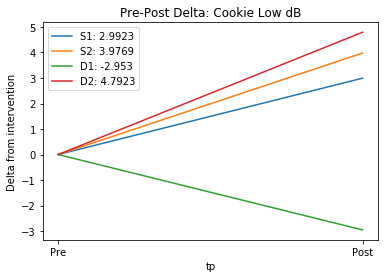

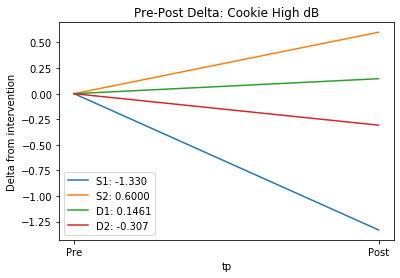

In [54]:
# Plots: want to compare gradients of the 4 groups' DELTAS
# Make lineplots of all 4 groups on one plot for eachof the voice measures

tp=['Post', 'Pre']
delta_df=pd.DataFrame(columns=['tp'])

for meandf in meandflist:
    varname=meandf.columns[0]
    temp_S=meandf.loc[meandf['First Intervention']=='S'].iloc[:, np.r_[2,4,6]]
    temp_D=meandf.loc[meandf['First Intervention']=='D'].iloc[:, np.r_[2,4,6]]
    temp_S_delta=pd.DataFrame(columns=['Zero', 'Delta V2-BL', 'Zero', 'Delta V4-V2'])
    temp_D_delta=pd.DataFrame(columns=['Zero', 'Delta V2-BL', 'Zero', 'Delta V4-V2'])
    temp_S_delta['Delta V2-BL']=temp_S.iloc[:,1]-temp_S.iloc[:,0]
    temp_S_delta['Delta V4-V2']=temp_S.iloc[:,2]-temp_S.iloc[:,1]
    temp_S_delta['Zero']=0
    temp_D_delta['Delta V2-BL']=temp_D.iloc[:,1]-temp_D.iloc[:,0]
    temp_D_delta['Delta V4-V2']=temp_D.iloc[:,2]-temp_D.iloc[:,1]
    temp_D_delta['Zero']=0
    temp_S_avg=temp_S_delta.mean(axis=0)
    temp_D_avg=temp_D_delta.mean(axis=0)
    
    delta_df=pd.DataFrame(columns=['tp'])
    delta_df['tp']=tp
    delta_df.sort_values('tp', ascending=False, inplace=True)
    delta_df['S1']=temp_S_avg[:2].values
    delta_df['S2']=temp_S_avg[2:].values
    delta_df['D1']=temp_D_avg[:2].values
    delta_df['D2']=temp_D_avg[2:].values
    
    plt.figure()
    sns.lineplot(x='tp', y='S1', data=delta_df, sort=False, label='S1: '+str(delta_df['S1'].iloc[1])[0:6])
    sns.lineplot(x='tp', y='S2', data=delta_df, sort=False, label='S2: '+str(delta_df['S2'].iloc[1])[0:6])
    sns.lineplot(x='tp', y='D1', data=delta_df, sort=False, label='D1: '+str(delta_df['D1'].iloc[1])[0:6])
    sns.lineplot(x='tp', y='D2', data=delta_df, sort=False, label='D2: '+str(delta_df['D2'].iloc[1])[0:6]).set_title('Pre-Post Delta: '+varname)
    plt.ylabel('Delta from intervention')
    plt.show()

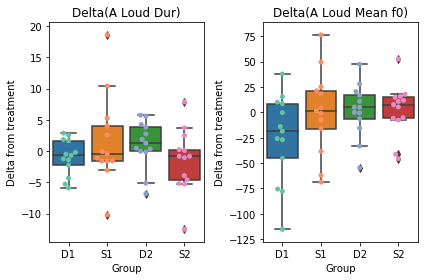

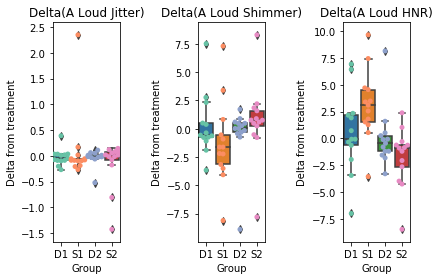

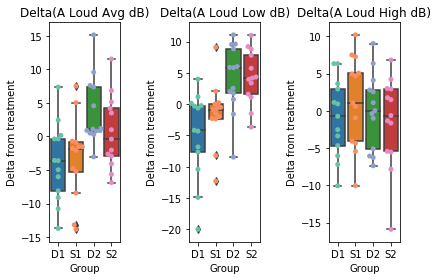

In [18]:
# Plots: want to compare delta of treatments with control delta
# Control: Discussion group V2-BL
# Make vertical boxplots w/ treatment side by side with control
# Then find correct test to see if significant difference in the distributions (diff dists)
# If yes then indicate with a star over the data pair on the boxplot

# A Loud plots
# Duration, Mean f0, Jitter, Shimer, HNR, Avg dB, Min dB, Max dB
plt.subplot(1,2,1)
sns.boxplot(x='Group', y='Delta from treatment', data=amax_dur_plot).set_title('Delta(A Loud Dur)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amax_dur_plot, palette='Set2')
plt.subplot(1,2,2)
sns.boxplot(x='Group', y='Delta from treatment', data=amax_mf0_plot).set_title('Delta(A Loud Mean f0)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amax_mf0_plot, palette='Set2')
plt.tight_layout()
plt.show()
plt.subplot(1,3,1)
sns.boxplot(x='Group', y='Delta from treatment', data=amax_jit_plot).set_title('Delta(A Loud Jitter)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amax_jit_plot, palette='Set2')
plt.subplot(1,3,2)
sns.boxplot(x='Group', y='Delta from treatment', data=amax_shm_plot).set_title('Delta(A Loud Shimmer)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amax_shm_plot, palette='Set2')
plt.subplot(1,3,3)
sns.boxplot(x='Group', y='Delta from treatment', data=amax_hnr_plot).set_title('Delta(A Loud HNR)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amax_hnr_plot, palette='Set2')
plt.tight_layout()
plt.show()
plt.subplot(1,3,1)
sns.boxplot(x='Group', y='Delta from treatment', data=amax_avgdb_plot).set_title('Delta(A Loud Avg dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amax_avgdb_plot, palette='Set2')
plt.subplot(1,3,2)
sns.boxplot(x='Group', y='Delta from treatment', data=amax_mindb_plot).set_title('Delta(A Loud Low dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amax_mindb_plot, palette='Set2')
plt.subplot(1,3,3)
sns.boxplot(x='Group', y='Delta from treatment', data=amax_maxdb_plot).set_title('Delta(A Loud High dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amax_maxdb_plot, palette='Set2')
plt.tight_layout()


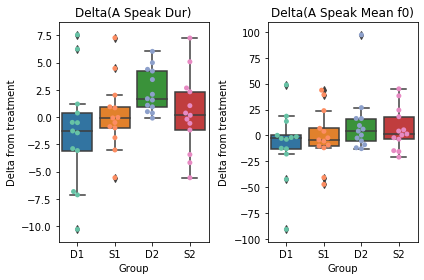

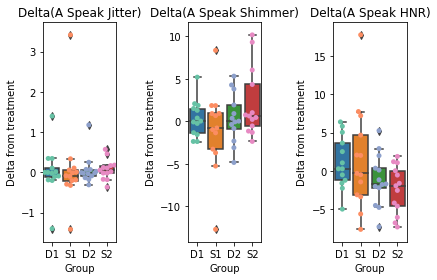

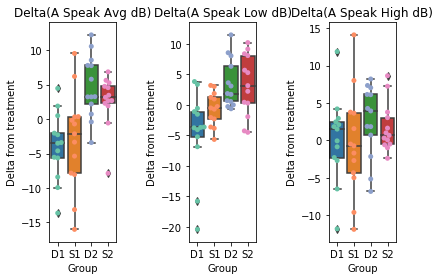

In [55]:
# A Speak Plots
plt.subplot(1,2,1)
sns.boxplot(x='Group', y='Delta from treatment', data=amin_dur_plot).set_title('Delta(A Speak Dur)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amin_dur_plot, palette='Set2')
plt.subplot(1,2,2)
sns.boxplot(x='Group', y='Delta from treatment', data=amin_mf0_plot).set_title('Delta(A Speak Mean f0)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amin_mf0_plot, palette='Set2')
plt.tight_layout()
plt.show()
plt.subplot(1,3,1)
sns.boxplot(x='Group', y='Delta from treatment', data=amin_jit_plot).set_title('Delta(A Speak Jitter)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amin_jit_plot, palette='Set2')
plt.subplot(1,3,2)
sns.boxplot(x='Group', y='Delta from treatment', data=amin_shm_plot).set_title('Delta(A Speak Shimmer)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amin_shm_plot, palette='Set2')
plt.subplot(1,3,3)
sns.boxplot(x='Group', y='Delta from treatment', data=amin_hnr_plot).set_title('Delta(A Speak HNR)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amin_hnr_plot, palette='Set2')
plt.tight_layout()
plt.show()
plt.subplot(1,3,1)
sns.boxplot(x='Group', y='Delta from treatment', data=amin_avgdb_plot).set_title('Delta(A Speak Avg dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amin_avgdb_plot, palette='Set2')
plt.subplot(1,3,2)
sns.boxplot(x='Group', y='Delta from treatment', data=amin_mindb_plot).set_title('Delta(A Speak Low dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amin_mindb_plot, palette='Set2')
plt.subplot(1,3,3)
sns.boxplot(x='Group', y='Delta from treatment', data=amin_maxdb_plot).set_title('Delta(A Speak High dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=amin_maxdb_plot, palette='Set2')
plt.tight_layout()


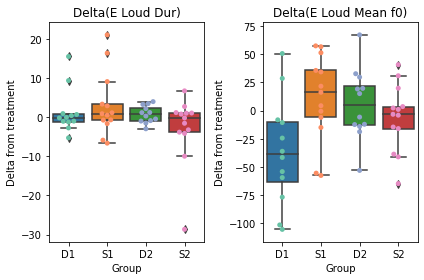

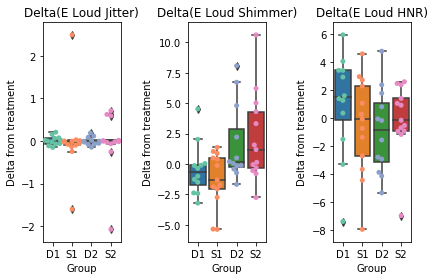

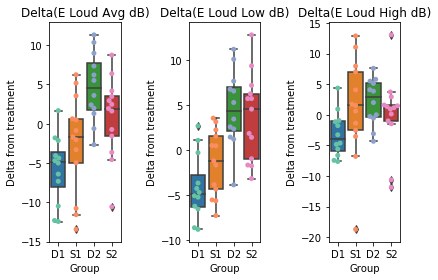

In [33]:
# E Loud plots
# Duration, Mean f0, Jitter, Shimer, HNR, Avg dB, Min dB, Max dB
plt.subplot(1,2,1)
sns.boxplot(x='Group', y='Delta from treatment', data=emax_dur_plot).set_title('Delta(E Loud Dur)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emax_dur_plot, palette='Set2')
plt.subplot(1,2,2)
sns.boxplot(x='Group', y='Delta from treatment', data=emax_mf0_plot).set_title('Delta(E Loud Mean f0)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emax_mf0_plot, palette='Set2')
plt.tight_layout()
plt.show()
plt.subplot(1,3,1)
sns.boxplot(x='Group', y='Delta from treatment', data=emax_jit_plot).set_title('Delta(E Loud Jitter)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emax_jit_plot, palette='Set2')
plt.subplot(1,3,2)
sns.boxplot(x='Group', y='Delta from treatment', data=emax_shm_plot).set_title('Delta(E Loud Shimmer)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emax_shm_plot, palette='Set2')
plt.subplot(1,3,3)
sns.boxplot(x='Group', y='Delta from treatment', data=emax_hnr_plot).set_title('Delta(E Loud HNR)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emax_hnr_plot, palette='Set2')
plt.tight_layout()
plt.show()
plt.subplot(1,3,1)
sns.boxplot(x='Group', y='Delta from treatment', data=emax_avgdb_plot).set_title('Delta(E Loud Avg dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emax_avgdb_plot, palette='Set2')
plt.subplot(1,3,2)
sns.boxplot(x='Group', y='Delta from treatment', data=emax_mindb_plot).set_title('Delta(E Loud Low dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emax_mindb_plot, palette='Set2')
plt.subplot(1,3,3)
sns.boxplot(x='Group', y='Delta from treatment', data=emax_maxdb_plot).set_title('Delta(E Loud High dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emax_maxdb_plot, palette='Set2')
plt.tight_layout()


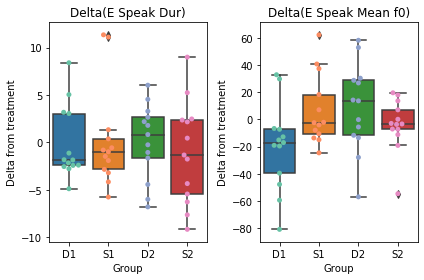

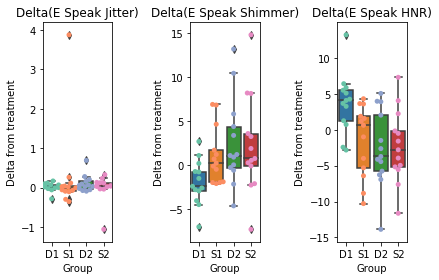

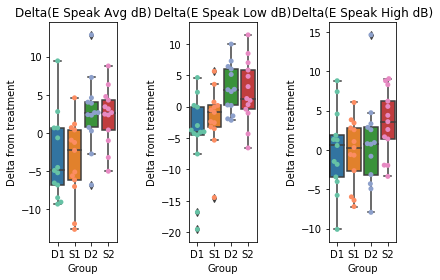

In [29]:
# E Speak Plots
plt.subplot(1,2,1)
sns.boxplot(x='Group', y='Delta from treatment', data=emin_dur_plot).set_title('Delta(E Speak Dur)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emin_dur_plot, palette='Set2')
plt.subplot(1,2,2)
sns.boxplot(x='Group', y='Delta from treatment', data=emin_mf0_plot).set_title('Delta(E Speak Mean f0)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emin_mf0_plot, palette='Set2')
plt.tight_layout()
plt.show()
plt.subplot(1,3,1)
sns.boxplot(x='Group', y='Delta from treatment', data=emin_jit_plot).set_title('Delta(E Speak Jitter)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emin_jit_plot, palette='Set2')
plt.subplot(1,3,2)
sns.boxplot(x='Group', y='Delta from treatment', data=emin_shm_plot).set_title('Delta(E Speak Shimmer)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emin_shm_plot, palette='Set2')
plt.subplot(1,3,3)
sns.boxplot(x='Group', y='Delta from treatment', data=emin_hnr_plot).set_title('Delta(E Speak HNR)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emin_hnr_plot, palette='Set2')
plt.tight_layout()
plt.show()
plt.subplot(1,3,1)
sns.boxplot(x='Group', y='Delta from treatment', data=emin_avgdb_plot).set_title('Delta(E Speak Avg dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emin_avgdb_plot, palette='Set2')
plt.subplot(1,3,2)
sns.boxplot(x='Group', y='Delta from treatment', data=emin_mindb_plot).set_title('Delta(E Speak Low dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emin_mindb_plot, palette='Set2')
plt.subplot(1,3,3)
sns.boxplot(x='Group', y='Delta from treatment', data=emin_maxdb_plot).set_title('Delta(E Speak High dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=emin_maxdb_plot, palette='Set2')
plt.tight_layout()


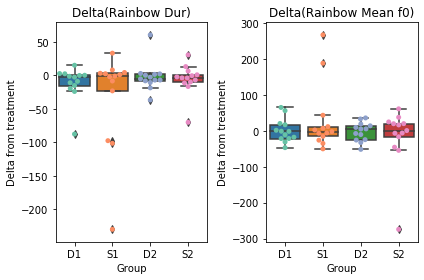

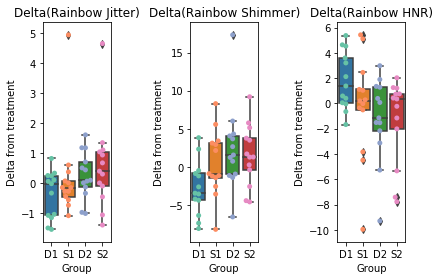

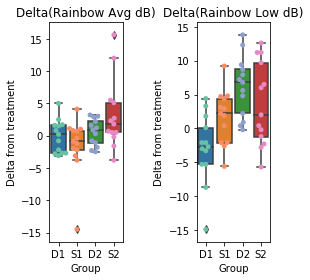

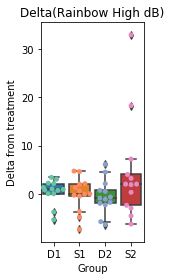

In [30]:
# Rainbow Plots
plt.subplot(1,2,1)
sns.boxplot(x='Group', y='Delta from treatment', data=rain_dur_plot).set_title('Delta(Rainbow Dur)')
sns.swarmplot(x='Group', y='Delta from treatment', data=rain_dur_plot, palette='Set2')
plt.subplot(1,2,2)
sns.boxplot(x='Group', y='Delta from treatment', data=rain_mf0_plot).set_title('Delta(Rainbow Mean f0)')
sns.swarmplot(x='Group', y='Delta from treatment', data=rain_mf0_plot, palette='Set2')
plt.tight_layout()
plt.show()
plt.subplot(1,3,1)
sns.boxplot(x='Group', y='Delta from treatment', data=rain_jit_plot).set_title('Delta(Rainbow Jitter)')
sns.swarmplot(x='Group', y='Delta from treatment', data=rain_jit_plot, palette='Set2')
plt.subplot(1,3,2)
sns.boxplot(x='Group', y='Delta from treatment', data=rain_shm_plot).set_title('Delta(Rainbow Shimmer)')
sns.swarmplot(x='Group', y='Delta from treatment', data=rain_shm_plot, palette='Set2')
plt.subplot(1,3,3)
sns.boxplot(x='Group', y='Delta from treatment', data=rain_hnr_plot).set_title('Delta(Rainbow HNR)')
sns.swarmplot(x='Group', y='Delta from treatment', data=rain_hnr_plot, palette='Set2')
plt.tight_layout()
plt.show()
plt.subplot(1,3,1)
sns.boxplot(x='Group', y='Delta from treatment', data=rain_avgdb_plot).set_title('Delta(Rainbow Avg dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=rain_avgdb_plot, palette='Set2')
plt.subplot(1,3,2)
sns.boxplot(x='Group', y='Delta from treatment', data=rain_mindb_plot).set_title('Delta(Rainbow Low dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=rain_mindb_plot, palette='Set2')
plt.tight_layout()
plt.show()
plt.subplot(1,3,1)
sns.boxplot(x='Group', y='Delta from treatment', data=rain_maxdb_plot).set_title('Delta(Rainbow High dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=rain_maxdb_plot, palette='Set2')
plt.tight_layout()


C:\Users\kevin\Downloads\Install\Programming\Anaconda\lib\site-packages\seaborn\categorical.py:1326: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\kevin\Downloads\Install\Programming\Anaconda\lib\site-packages\seaborn\categorical.py:1330: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter


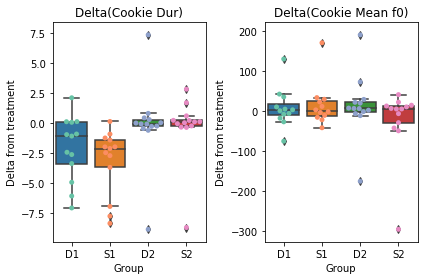

C:\Users\kevin\Downloads\Install\Programming\Anaconda\lib\site-packages\seaborn\categorical.py:1326: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\kevin\Downloads\Install\Programming\Anaconda\lib\site-packages\seaborn\categorical.py:1330: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\kevin\Downloads\Install\Programming\Anaconda\lib\site-packages\seaborn\categorical.py:1326: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\kevin\Downloads\Install\Programming\Anaconda\lib\site-packages\seaborn\categorical.py:1330: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\kevin\Downloads\Install\Programming\Anaconda\lib\site-packages\seaborn\categorical.py:1326: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\kevin\Downloads\Install\Programming\Anaconda\lib\site-packages\sea

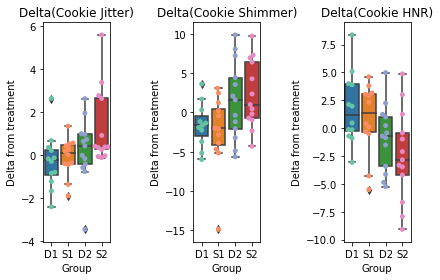

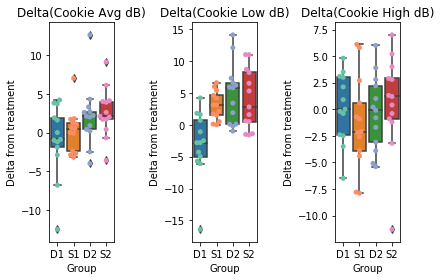

In [31]:
# Cookie Plots
plt.subplot(1,2,1)
sns.boxplot(x='Group', y='Delta from treatment', data=cookie_dur_plot).set_title('Delta(Cookie Dur)')
sns.swarmplot(x='Group', y='Delta from treatment', data=cookie_dur_plot, palette='Set2')
plt.subplot(1,2,2)
sns.boxplot(x='Group', y='Delta from treatment', data=cookie_mf0_plot).set_title('Delta(Cookie Mean f0)')
sns.swarmplot(x='Group', y='Delta from treatment', data=cookie_mf0_plot, palette='Set2')
plt.tight_layout()
plt.show()
plt.subplot(1,3,1)
sns.boxplot(x='Group', y='Delta from treatment', data=cookie_jit_plot).set_title('Delta(Cookie Jitter)')
sns.swarmplot(x='Group', y='Delta from treatment', data=cookie_jit_plot, palette='Set2')
plt.subplot(1,3,2)
sns.boxplot(x='Group', y='Delta from treatment', data=cookie_shm_plot).set_title('Delta(Cookie Shimmer)')
sns.swarmplot(x='Group', y='Delta from treatment', data=cookie_shm_plot, palette='Set2')
plt.subplot(1,3,3)
sns.boxplot(x='Group', y='Delta from treatment', data=cookie_hnr_plot).set_title('Delta(Cookie HNR)')
sns.swarmplot(x='Group', y='Delta from treatment', data=cookie_hnr_plot, palette='Set2')
plt.tight_layout()
plt.show()
plt.subplot(1,3,1)
sns.boxplot(x='Group', y='Delta from treatment', data=cookie_avgdb_plot).set_title('Delta(Cookie Avg dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=cookie_avgdb_plot, palette='Set2')
plt.subplot(1,3,2)
sns.boxplot(x='Group', y='Delta from treatment', data=cookie_mindb_plot).set_title('Delta(Cookie Low dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=cookie_mindb_plot, palette='Set2')
plt.subplot(1,3,3)
sns.boxplot(x='Group', y='Delta from treatment', data=cookie_maxdb_plot).set_title('Delta(Cookie High dB)')
sns.swarmplot(x='Group', y='Delta from treatment', data=cookie_maxdb_plot, palette='Set2')
plt.tight_layout()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47


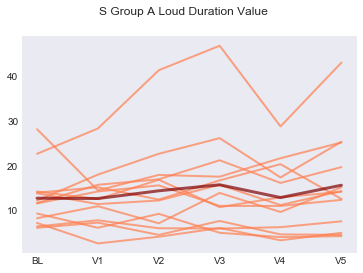

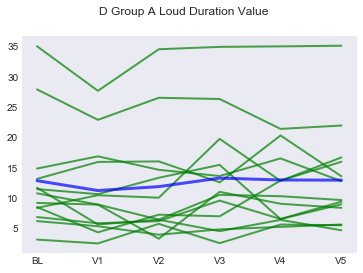

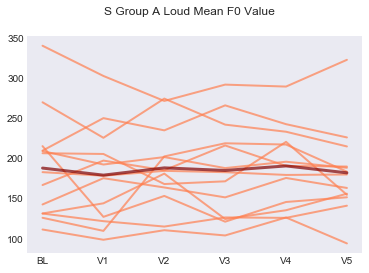

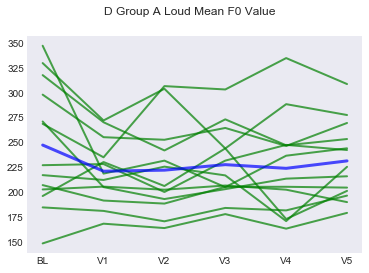

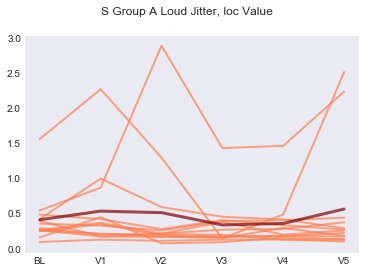

...

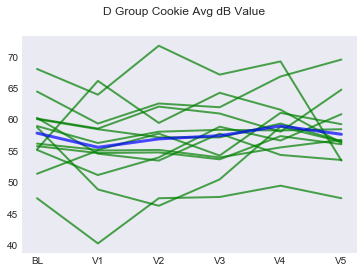

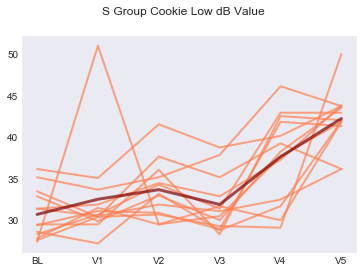

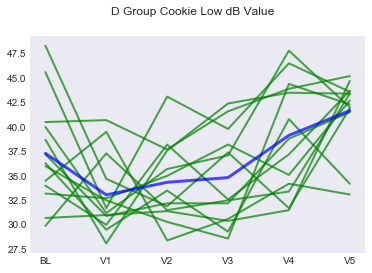

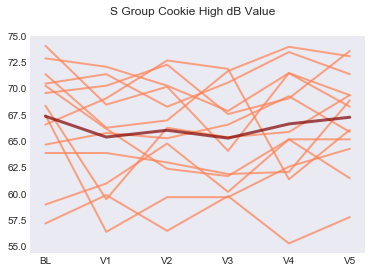

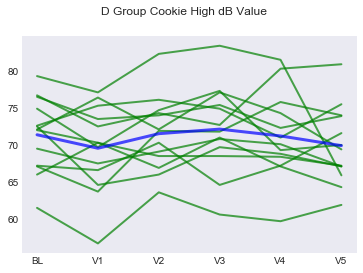

In [167]:
# Narrative Q: Does treatment produce change that lasts?
# First: make spaghetti plot of absolute values over each timpeoint, then mean deltas
# Plot BL-->V5 values for S patients then D patients

timepoints=['BL', 'V1', 'V2', 'V3', 'V4', 'V5']

for i in meandflist:
    temp_S=i.loc[i['First Intervention']=='S'].iloc[:, 2:8]
    temp_D=i.loc[i['First Intervention']=='D'].iloc[:, 2:8]
    temp_S_avg=temp_S.mean(axis=0)
    temp_D_avg=temp_D.mean(axis=0)
    
    plt.figure()
    # All of the S group plots (S1-S2)
    # First plot the individual patients' data
    for patient in range(0,13):
        plotS=temp_S.iloc[patient]
        plt.plot(timepoints, plotS, marker='', color='#FF7F50', linewidth=2, alpha=0.7)
    # Then plot mean of all patients for each time point, draw line connecting 
    plt.plot(timepoints, temp_S_avg, marker='', color='#800000', linewidth=3, alpha=0.7)
    plt.grid()
    plt.suptitle('S Group '+i.columns[0]+' Value')
   
    
    plt.figure()
    # All of the D group plots (D1-D2)
    for patient in range(0,13):
        plotD=temp_D.iloc[patient]
        plt.plot(timepoints, plotD, marker='', color='green', linewidth=2, alpha=0.7)
    plt.plot(timepoints, temp_D_avg, marker='', color='blue', linewidth=3, alpha=0.7)
    plt.grid()
    plt.suptitle('D Group '+i.columns[0]+' Value')
        

In [34]:
# # Now: make spaghetti plot of deltas of values since end of treatment.
# # x timepoints start at end of intervention (S1:V2 and D2:V4), with delta obviously initially equal to 0.
# # Plot V2-->V5 for S1, V4-->V5 for D2
# # Note: we're plotting the delta from timepoint to timepoint - NOT just compared to end treatment.
# for i in meandflist:
#     temp_S=i.loc[i['First Intervention']=='S']
#     temp_D=i.loc[i['First Intervention']=='D']
#     temp_S=temp_S.iloc[:, 4:8]
#     temp_D=temp_D.iloc[:, 6:8]
#     # S1: Subtract V2 from everything, then subtract V3 from V4&V5, then V4 from V5
#     temp_S.loc[:, temp_S.columns]=temp_S[temp_S.columns].rsub(temp_S.iloc[:, 0], 0)
#     temp_S.loc[:, temp_S.columns[2:]]=temp_S[temp_S.columns[2:]].rsub(temp_S.iloc[:, 1], 0)
#     temp_S.loc[:, temp_S.columns[3]]=temp_S[temp_S.columns[3]].rsub(temp_S.iloc[:, 2], 0)
#     # D2: Subtract V4 from V5
#     temp_D.loc[:, temp_D.columns]=temp_D[temp_D.columns].rsub(temp_D.iloc[:, 0], 0)
    
#     plt.figure()
#     for patient in range(0,13):
#         plotS=temp_S.iloc[patient]
#         plotD=temp_D.iloc[patient]
#         plt.plot(S_timepoints, plotS, marker='', color='#005959', linewidth=2, alpha=0.4)
#         plt.plot(D_timepoints, plotD, marker='', color='#B20000', linewidth=2, alpha=0.4)
#         plt.suptitle(i.columns[0]+' Delta From Previous Timepoint After Treatment End')


In [35]:
# Raw values since treatment t-tests
# Do paired t-tests for consec timepoints: V3-V2, V4-V3, V5-V4
# Also do paired t-tests for tps compared to BL for overall effectiveness/improvement
# Write results to df
# Ttest_rel is 2 sided, use two sided pval
# post_ttests_raw=pd.DataFrame(columns=['Variable', 'S: V2 vs. V3', 'S: V3 vs. V4', 'S: V4 vs. V5',
#                                      'S: V2 vs. BL', 'S: V3 vs. BL', 'S: V4 vs. BL', 'S: V5 vs. BL',
#                                      'D: V5 vs. V4', 'D: V4 vs. BL', 'D: V5 vs. BL'])
# tempdf=pd.DataFrame(columns=['Variable', 'S: V2 vs. V3', 'S: V3 vs. V4', 'S: V4 vs. V5',
#                                      'S: V2 vs. BL', 'S: V3 vs. BL', 'S: V4 vs. BL', 'S: V5 vs. BL',
#                                      'D: V5 vs. V4', 'D: V4 vs. BL', 'D: V5 vs. BL'], index=['Varname'])

# for i in meandflist:
#     temp_S=i.loc[i['First Intervention']=='S']
#     temp_D=i.loc[i['First Intervention']=='D']
#     S_BL=temp_S.iloc[:, 2]
#     D_BL=temp_D.iloc[:, 2]
#     temp_S=pd.concat([temp_S.iloc[:, 4:8], S_BL], axis=1)
#     temp_D=pd.concat([temp_D.iloc[:, 6:8], D_BL], axis=1)
#     tempdf['Variable']=i.columns[0]
    
#     # S consec timepoints
#     for j in range(1,4):
#         p=stats.ttest_rel(temp_S.iloc[:,j-1], temp_S.iloc[:,j]).pvalue
#         p=round(p, 5)
#         tempdf.iloc[:, j]=p
            
#     # S timepoints vs baseline
#     for j in range(4,8):
#         p=stats.ttest_rel(temp_S.iloc[:,j-4], temp_S.iloc[:,4]).pvalue
#         p=round(p, 5)
#         tempdf.iloc[:, j]=p
        
#     # D V5 vs. V4 and V4, V5 vs. BL
#     p=stats.ttest_rel(temp_D.iloc[:, 1], temp_D.iloc[:, 0]).pvalue
#     p=round(p, 5)
#     tempdf.iloc[:, 8]=p
#     for j in range(0,2):
#         p=stats.ttest_ind(temp_D.iloc[:,j], temp_S.iloc[:,2]).pvalue
#         p=round(p, 5)
#         tempdf.iloc[:, j+9]=p
#     post_ttests_raw=pd.concat([post_ttests_raw, tempdf], sort=False)
    
# post_ttests_raw

In [36]:
# # Delta btwn consec timepoints since treatment t-tests
# # Do paired t-tests for consec timepoints: V4-V3, V5-V4
# # This tests to see if the amount of change for those timepoints is significantly different
# # ie, does change slow down? speed up?
# # Write results to df
# # Ttest rel is 2 sided by default, so if the var falls in the 1 sided list then divide by 2
# post_ttests_delta=pd.DataFrame(columns=['Variable', 'S: V3 vs. V4', 'S: V4 vs. V5'], index=['Varname'])
# tempdf=pd.DataFrame(columns=['Variable', 'S: V3 vs. V4', 'S: V4 vs. V5'], index=['Varname'])

# for i in meandflist:
#     temp_S=i.loc[i['First Intervention']=='S']
#     temp_S=temp_S.iloc[:, 4:7]
#     tempdf['Variable']=i.columns[0]
    
#     # S consec timepoints
#     for j in range(0, 2):
#         p=stats.ttest_ind(temp_S.iloc[:,j], temp_S.iloc[:,j+1]).pvalue
#         p=round(p, 5)
#         tempdf.iloc[:, j+1]=p   
    
#     post_ttests_delta=pd.concat([post_ttests_delta, tempdf], sort=False)
# post_ttests_delta=post_ttests_delta.iloc[1:]
# post_ttests_delta

In [37]:
# # Write post ttest results to excel
# post_ttests_raw.to_excel(r'C:\Users\kevin\Documents\JHU\Labs\Parkinsonics\TTest_Post_Raw.xlsx')
# post_ttests_delta.to_excel(r'C:\Users\kevin\Documents\JHU\Labs\Parkinsonics\TTest_Post_Delta.xlsx')